# How I learnt to scrape Thailand’s COVID Data
## Dylan Jay
## ThaiPy 2021/03/11

Questions? 
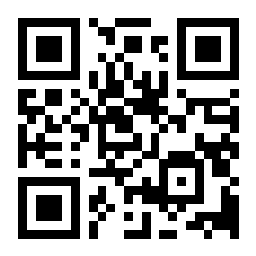
https://app.sli.do/event/exfpjpbq

# What I learnt
- Getting files from web, webdav, json apis
    -  requests, webdavclient3
- Extracting from PDF, PDFS of PPTx, PowerPoint Charts and Excel
    - tabula, tika, BeautifulSoup4, openpyxl, python-pptx, dateutil
- Combine and clean data
    - Pandas
- Plot the data
    - matplotlib/pandas
- Automate
    - github actions


# Why did I do this?


# January 2020

Testing updates stopped just before new year

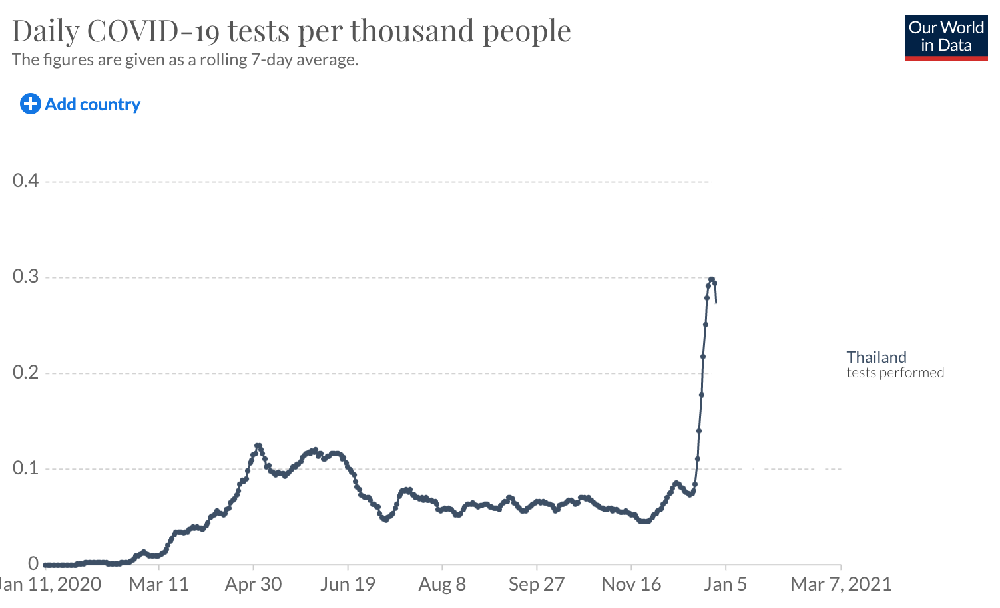

# Absence of data creates...
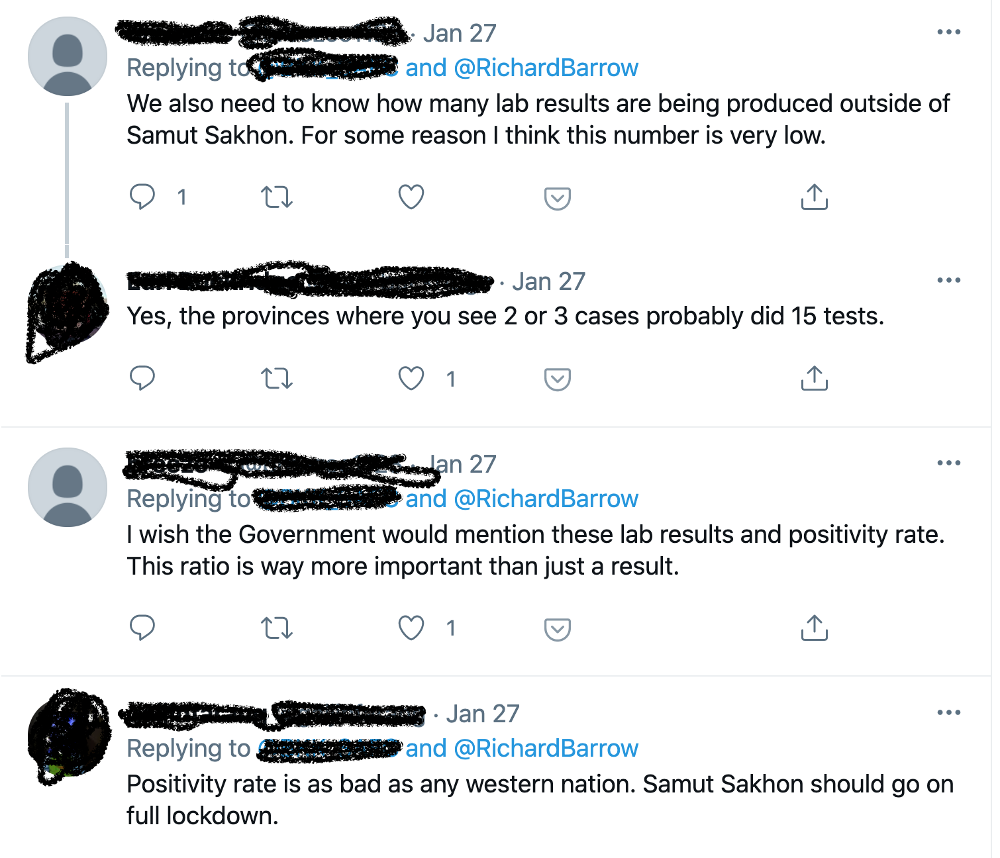

# PUI - Person Under Investigation
- Criteria (symptoms + at risk)
- = free test
- Correlated with Tests?

# Total number of laboratory tests

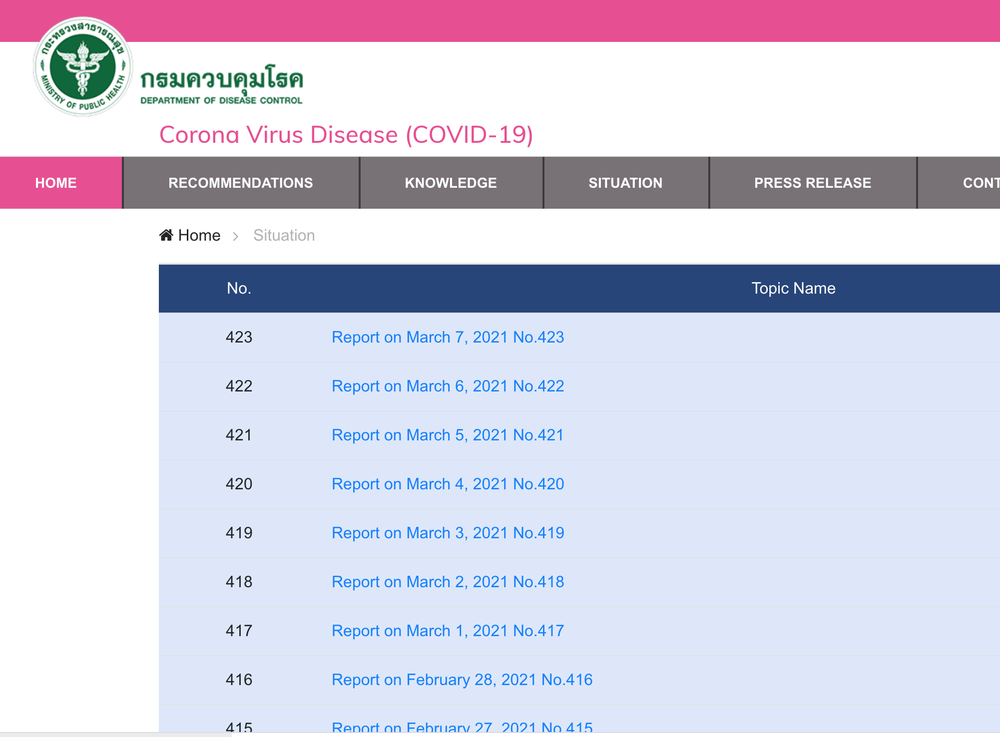

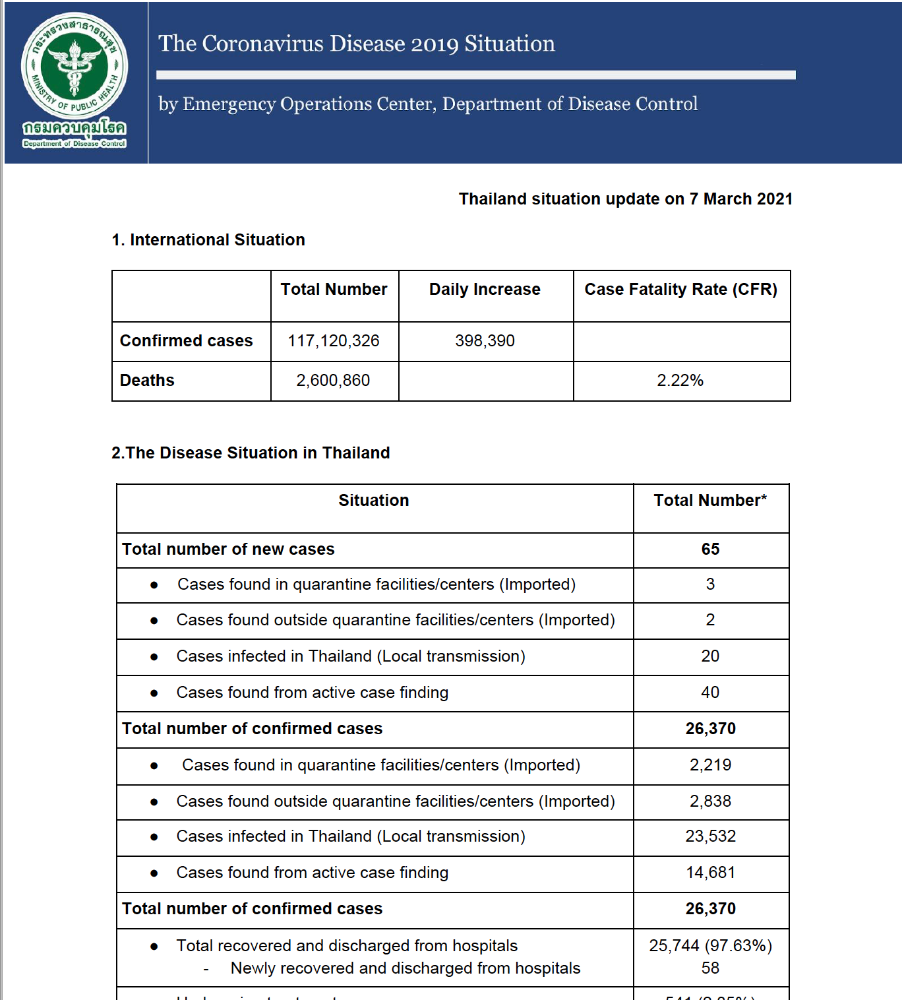



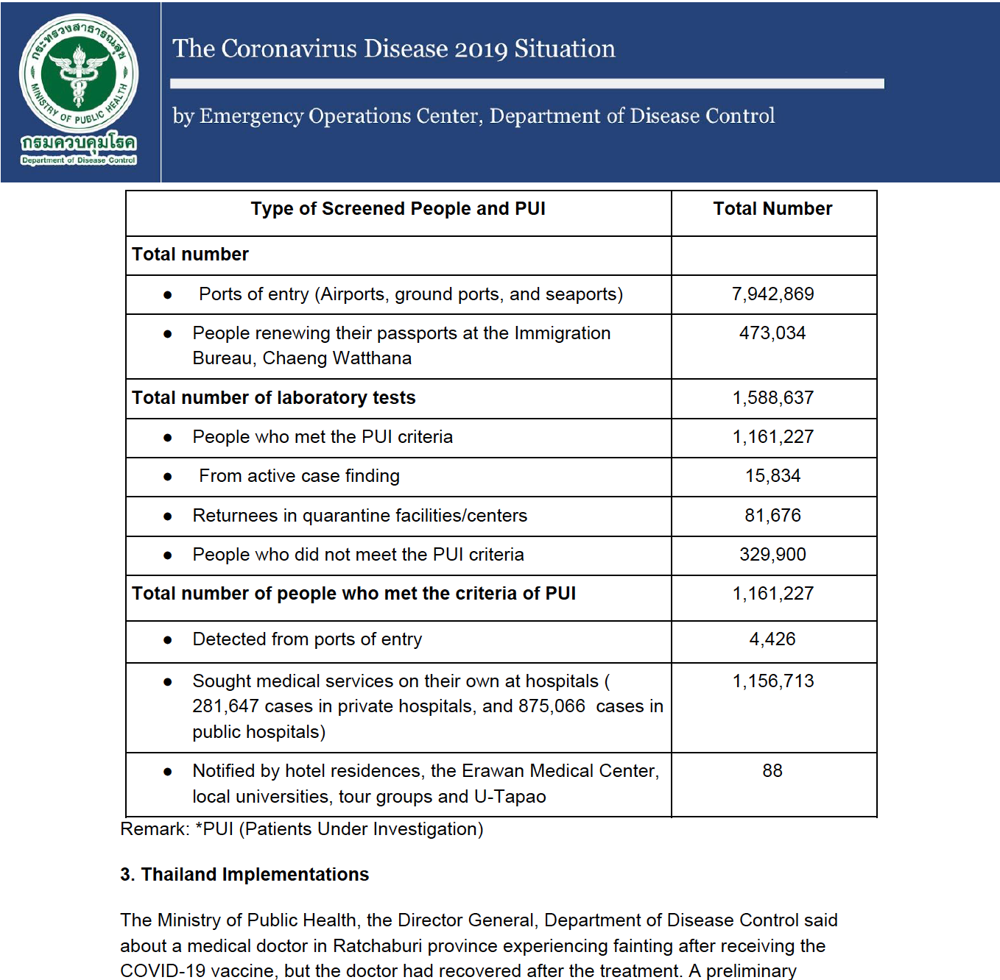

# Step 1: PDFs, how hard can it be?

In [7]:
import requests
import os
os.makedirs("situation_en", exist_ok=True); os.makedirs("situation_th", exist_ok=True)
with open("situation_en/situation-no423-070364.pdf", 'wb') as f:
    f.write(requests.get("https://ddc.moph.go.th/viralpneumonia/eng/file/situation/situation-no423-070364.pdf").content)
with open("situation_th/situation-no394-310164.pdf", 'wb') as f:
    f.write(requests.get("https://ddc.moph.go.th/viralpneumonia/file/situation/situation-no394-310164.pdf").content)

In [4]:
import tabula
tabula.read_pdf("situation_en/situation-no423-070364.pdf", pages=1)

[        Unnamed: 0 Total Number Daily Increase Case Fatality Rate (CFR)
 0  Confirmed cases  117,120,326        398,390                      NaN
 1           Deaths    2,600,860            NaN                    2.22%,
                                             Situation    Total Number*
 0                           Total number of new cases               65
 1   ●Cases found in quarantine facilities/centers ...                3
 2   ● Cases found outside quarantine facilities/ce...                2
 3   ● Cases infected in Thailand (Local transmission)               20
 4              ● Cases found from active case finding               40
 5                     Total number of confirmed cases           26,370
 6   ●Cases found in quarantine facilities/centers ...            2,219
 7   ● Cases found outside quarantine facilities/ce...            2,838
 8   ● Cases infected in Thailand (Local transmission)           23,532
 9              ● Cases found from active case finding      

In [6]:
tabula.read_pdf("situation_en/situation-no423-070364.pdf", pages=2)

[                      Type of Screened People and PUI Total Number
 0                                        Total number          NaN
 1   ●Ports of entry (Airports, ground ports, and s...    7,942,869
 2   ● People renewing their passports at the Immig...      473,034
 3                             Bureau, Chaeng Watthana          NaN
 4                    Total number of laboratory tests    1,588,637
 5                   ● People who met the PUI criteria    1,161,227
 6                           ●From active case finding       15,834
 7        ● Returnees in quarantine facilities/centers       81,676
 8          ● People who did not meet the PUI criteria      329,900
 9   Total number of people who met the criteria of...    1,161,227
 10                     ● Detected from ports of entry        4,426
 11  ● Sought medical services on their own at hosp...    1,156,713
 12  281,647 cases in private hospitals, and 875,06...          NaN
 13                                  public hosp

# But...
- Didn't work for all pdfs - then you get nothing
- Didn't work for thai pdfs
- slow

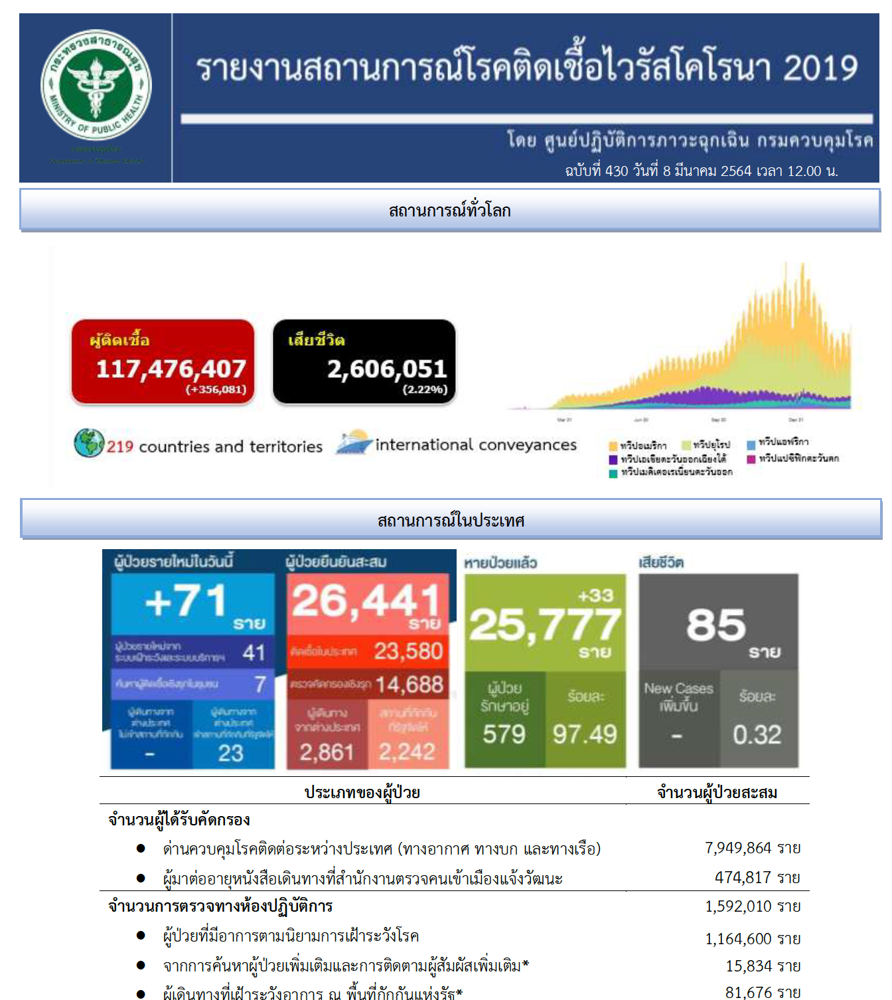

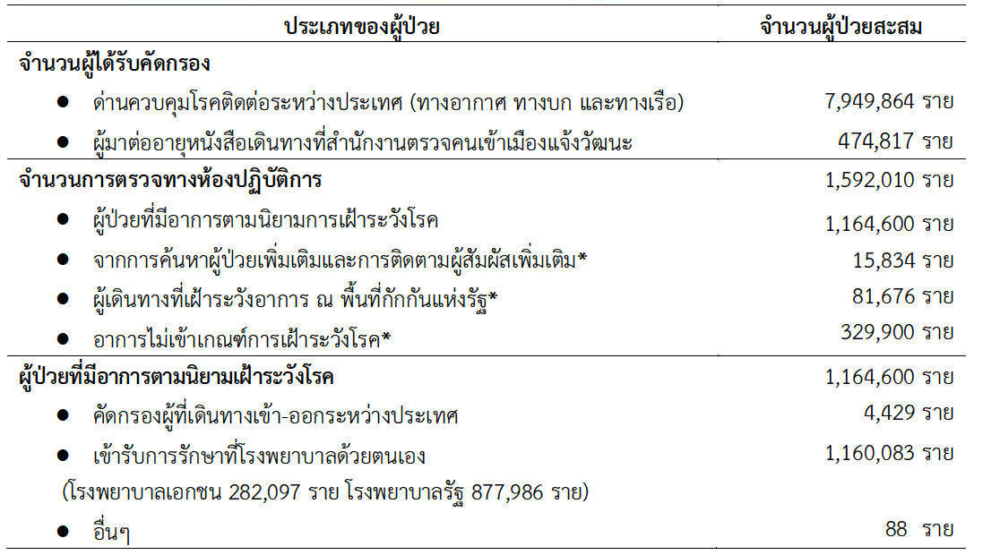

In [7]:
tabula.read_pdf("situation_th/situation-no394-310164.pdf", pages=1)

[]

# Tika
- fast
- gives text
- needs java
- does more than just pdfs

In [8]:
from tika import parser
parsedPDF = parser.from_file("situation_en/situation-no423-070364.pdf")
print(parsedPDF['content'].strip())

Thailand situation update on 7 March 2021 

1. International Situation 

 

2.The Disease Situation in Thailand 

 

 

Translated by Office of International Cooperation, DDC Thailand   1 

  Total Number Daily Increase Case Fatality Rate (CFR) 

Confirmed cases 117,120,326 398,390   

Deaths 2,600,860   2.22% 

Situation Total Number* 

Total number of new cases 65 

●    Cases found in quarantine facilities/centers (Imported) 3 

● Cases found outside quarantine facilities/centers (Imported) 2 

● Cases infected in Thailand (Local transmission) 20 

● Cases found from active case finding 40 

Total number of confirmed cases 26,370 

●     Cases found in quarantine facilities/centers (Imported) 2,219 

● Cases found outside quarantine facilities/centers (Imported) 2,838 

● Cases infected in Thailand (Local transmission) 23,532 

● Cases found from active case finding 14,681 

Total number of confirmed cases 26,370 

● Total recovered and discharged from hospitals  
- Newly recovered 

In [9]:
# Simple stupid number extraction
import re
def get_next_numbers(content, *matches, debug=False):
    if len(matches) == 0:
        matches = [""]
    for match in matches:
        s = re.split(match, content) if match else ("", content)
        if len(s) >= 2:
            content = s[1]
            numbers = re.findall(r"[,0-9]+", content)
            numbers = [n.replace(",", "") for n in numbers]
            numbers = [int(n) for n in numbers if n]
            return numbers, match + " " + content
    if debug and matches:
        print("Couldn't find '{}'".format(match))
        print(content)
    return [], content


In [11]:
numbers, content = get_next_numbers(parsedPDF['content'], "Total +number of laboratory tests",)
print(numbers)

[1588637, 1161227, 15834, 81676, 329900, 1161227, 4426, 281647, 875066, 1156713, 88, 19, 28, 4, 2022, 17697, 15981, 1603, 22, 91, 13, 150, 270, 1, 5, 24, 15, 13, 8, 1, 5, 4, 19, 19, 1, 7, 2021, 418, 35, 3, 1, 5, 1, 68, 16, 3, 350, 83, 7, 228, 65, 1, 66, 18, 9, 22, 6, 3, 17, 4, 9, 19, 1, 2, 1, 2, 19, 19, 3, 19, 19, 4]


# Downloading


In [ ]:
def web_links(*index_urls, ext=".pdf"):
    for index_url in index_urls:
        index = s.get(index_url)
        if index.status_code > 399: 
            continue
        links = re.findall("href=[\"'](.*?)[\"']", index.content.decode("utf-8"))
        for link in [urllib.parse.urljoin(index_url, l) for l in links if ext in l]:
            yield link

In [13]:
from covidthailand import *
def web_files(*index_urls, ext=".pdf", dir=os.getcwd()):
    for url in web_links(*index_urls, ext):
        modified = s.head(url).headers.get("last-modified") if CHECK_NEWER else None
        file = url.rsplit("/", 1)[-1]
        file = os.path.join(dir, file)
        if is_remote_newer(file, modified):
            r = s.get(url)
            if r.status_code != 200:
                continue
            os.makedirs(os.path.dirname(file), exist_ok=True)
            with open(file, "wb") as f:
                for chunk in r.iter_content(chunk_size=512 * 1024):
                    if chunk:  # filter out keep-alive new chunks
                        f.write(chunk)
        if "pdf" in ext:
            content = parser.from_file(file)
        else:
            with open(file) as f:
                content = f.read()
        yield os.path.basename(file), content

In [14]:
files = web_files("https://ddc.moph.go.th/viralpneumonia/eng/situation.php", ext=".pdf", dir="situation_en")
next(files)

('situation-no424-080364.pdf',
 {'metadata': {'Content-Type': 'application/pdf',
   'X-Parsed-By': ['org.apache.tika.parser.DefaultParser',
    'org.apache.tika.parser.pdf.PDFParser'],
   'X-TIKA:content_handler': 'ToTextContentHandler',
   'X-TIKA:embedded_depth': '0',
   'X-TIKA:parse_time_millis': '152',
   'access_permission:assemble_document': 'true',
   'access_permission:can_modify': 'true',
   'access_permission:can_print': 'true',
   'access_permission:can_print_degraded': 'true',
   'access_permission:extract_content': 'true',
   'access_permission:extract_for_accessibility': 'true',
   'access_permission:fill_in_form': 'true',
   'access_permission:modify_annotations': 'true',
   'dc:format': 'application/pdf; version=1.4',
   'dc:title': '8 March 2021',
   'pdf:PDFVersion': '1.4',
   'pdf:charsPerPage': ['998', '1852', '2357', '63'],
   'pdf:docinfo:producer': 'Skia/PDF m91 Google Docs Renderer',
   'pdf:docinfo:title': '8 March 2021',
   'pdf:encrypted': 'false',
   'pdf:h

# but when putting it togeather...
Real data is messy

In [15]:
def get_en_situation():
    results = []
    for file, parsedPDF in web_files(
        "https://ddc.moph.go.th/viralpneumonia/eng/situation.php", ext=".pdf", dir="situation_en"
    ):
        if "situation" not in file:
            continue
        date = file2date(file)
        numbers, _ = get_next_numbers(
            parsedPDF["content"], "Total +number of laboratory tests", debug=False
        )
        if numbers:
            tests_total, pui, active_finding, asq, not_pui, pui, pui_port, *rest = numbers
        else:
            numbers, _ = get_next_numbers(
                parsedPDF["content"], "Total number of people who met the criteria of patients", debug=False,
            )
            if date > dateutil.parser.parse("2020-01-30") and not numbers:
                raise Exception(f"Problem parsing {file}")
            elif not numbers:
                break
            tests_total, active_finding, asq, not_pui = [None] * 4
            pui, pui_airport, pui_seaport, pui_hospital, *rest = numbers
            pui_port = pui_airport + pui_seaport
        if pui in [1103858, 3891136, 433807, 96989]:  # mistypes?
            pui = None
        if tests_total in [783679, 849874, 936458]:
            tests_total = None
        results.append((date, tests_total, pui, active_finding, asq, not_pui))
        print(file, results[-1])

    results = pd.DataFrame(results,columns=["Date", "Tested", "PUI", "Active case finding", "ASQ", "Not PUI"]).set_index("Date")
    print(results)
    return results

In [16]:
en_situation = get_en_situation()

situation-no424-080364.pdf (datetime.datetime(2021, 3, 8, 0, 0), 1592010, 1164600, 15834, 81676, 329900)
situation-no423-070364.pdf (datetime.datetime(2021, 3, 7, 0, 0), 1588637, 1161227, 15834, 81676, 329900)
situation-no422-060364.pdf (datetime.datetime(2021, 3, 6, 0, 0), 1586258, 1158848, 15834, 81676, 329900)
situation-no421-050364.pdf (datetime.datetime(2021, 3, 5, 0, 0), 1583706, 1156296, 15834, 81676, 329900)
situation-no420-040364.pdf (datetime.datetime(2021, 3, 4, 0, 0), 1579597, 1152187, 15834, 81676, 329900)
situation-no419-030364.pdf (datetime.datetime(2021, 3, 3, 0, 0), 1574533, 1147123, 15834, 81676, 329900)
situation-no418-020364.pdf (datetime.datetime(2021, 3, 2, 0, 0), 1568978, 1141568, 15834, 81676, 329900)
situation-no417-010364.pdf (datetime.datetime(2021, 3, 1, 0, 0), 1563684, 1136274, 15834, 81676, 329900)
situation-no416-280264.pdf (datetime.datetime(2021, 2, 28, 0, 0), 1560449, 1133039, 15834, 81676, 329900)
situation-no415-270264.pdf (datetime.datetime(2021, 2,

situation-no346-161263.pdf (datetime.datetime(2020, 12, 16, 0, 0), 975969, 548559, 15834, 81676, 329900)
situation-no345-151263.pdf (datetime.datetime(2020, 12, 15, 0, 0), 974020, 546610, 15834, 81676, 329900)
situation-no344-141263.pdf (datetime.datetime(2020, 12, 14, 0, 0), 972051, 544641, 15834, 81676, 329900)
situation-no343-131263.pdf (datetime.datetime(2020, 12, 13, 0, 0), 970177, 542767, 15834, 81676, 329900)
situation-no342-121263.pdf (datetime.datetime(2020, 12, 12, 0, 0), 969130, 541720, 15834, 81676, 329900)
situation-no341-111263.pdf (datetime.datetime(2020, 12, 11, 0, 0), 967800, 540390, 15834, 81676, 329900)
situation-no340-101263.pdf (datetime.datetime(2020, 12, 10, 0, 0), 966037, 538627, 15834, 81676, 329900)
situation-no339-091263.pdf (datetime.datetime(2020, 12, 9, 0, 0), 964656, 537246, 15834, 81676, 329900)
situation-no338-081263.pdf (datetime.datetime(2020, 12, 8, 0, 0), 962906, 535496, 15834, 81676, 329900)
situation-no337-071263.pdf (datetime.datetime(2020, 12, 7

situation-no262-230963.pdf (datetime.datetime(2020, 9, 23, 0, 0), 870616, 443206, 15834, 81676, 329900)
situation-no261-220963.pdf (datetime.datetime(2020, 9, 22, 0, 0), 869165, 441755, 15834, 81676, 329900)
situation-no260-210963.pdf (datetime.datetime(2020, 9, 21, 0, 0), 868118, 440708, 15834, 81676, 329900)
situation-no259-200963.pdf (datetime.datetime(2020, 9, 20, 0, 0), 867179, 439769, 15834, 81676, 329900)
situation-no258-190963.pdf (datetime.datetime(2020, 9, 19, 0, 0), 866042, None, 15834, 81676, 329900)
situation-no257-180963.pdf (datetime.datetime(2020, 9, 18, 0, 0), 865200, 437790, 15834, 81676, 329900)
situation-no256-170963.pdf (datetime.datetime(2020, 9, 17, 0, 0), 864304, 436894, 15834, 81676, 329900)
situation-no255-160963.pdf (datetime.datetime(2020, 9, 16, 0, 0), 863232, 435822, 15834, 81676, 329900)
situation-no254-150963.pdf (datetime.datetime(2020, 9, 15, 0, 0), 862259, 434849, 15834, 81676, 329900)
situation-no253-140963.pdf (datetime.datetime(2020, 9, 14, 0, 0), 

situation-no180-030763.pdf (datetime.datetime(2020, 7, 3, 0, 0), 611559, 317273, 9775, 46266, 238245)
situation-no179-020763.pdf (datetime.datetime(2020, 7, 2, 0, 0), 609731, 315445, 9775, 46266, 238245)
situation-no178-010763.pdf (datetime.datetime(2020, 7, 1, 0, 0), 603657, 313813, 9775, 46266, 238245)
situation-no177-300663.pdf (datetime.datetime(2020, 6, 30, 0, 0), None, 312395, None, None, None)
situation-no176-290663.pdf (datetime.datetime(2020, 6, 29, 0, 0), None, 309371, None, None, None)
situation-no175-280663.pdf (datetime.datetime(2020, 6, 28, 0, 0), None, 307453, None, None, None)
situation-no174-270663.pdf (datetime.datetime(2020, 6, 27, 0, 0), None, 306790, None, None, None)
situation-no173-260663.pdf (datetime.datetime(2020, 6, 26, 0, 0), None, 305095, None, None, None)
situation-no172-250663.pdf (datetime.datetime(2020, 6, 25, 0, 0), None, 302670, None, None, None)
situation-no171-220663.pdf (datetime.datetime(2020, 6, 22, 0, 0), None, 294824, None, None, None)
situatio

situation-no94-060463.pdf (datetime.datetime(2020, 4, 6, 0, 0), None, 25857, None, None, None)
situation-no93-050463.pdf (datetime.datetime(2020, 4, 5, 0, 0), None, 25071, None, None, None)
situation-no92-040463.pdf (datetime.datetime(2020, 4, 4, 0, 0), None, 24474, None, None, None)
situation-no91-030463.pdf (datetime.datetime(2020, 4, 3, 0, 0), None, 23669, None, None, None)
situation-no90-020463.pdf (datetime.datetime(2020, 4, 2, 0, 0), None, 22453, None, None, None)
situation-no89-010463.pdf (datetime.datetime(2020, 4, 1, 0, 0), None, 21603, None, None, None)
situation-no88-310363.pdf (datetime.datetime(2020, 3, 31, 0, 0), None, 20097, None, None, None)
situation-no87-300363.pdf (datetime.datetime(2020, 3, 30, 0, 0), None, 18696, None, None, None)
situation-no86-290363.pdf (datetime.datetime(2020, 3, 29, 0, 0), None, 17779, None, None, None)
situation-no85-280363.pdf (datetime.datetime(2020, 3, 28, 0, 0), None, 17140, None, None, None)
situation-no84-270363.pdf (datetime.datetime(2

In [17]:
en_situation 

,Tested,PUI,Active case finding,ASQ,Not PUI
Date,,,,,
2021-03-08,1592010.0,1164600.0,15834.0,81676.0,329900.0
2021-03-07,1588637.0,1161227.0,15834.0,81676.0,329900.0
2021-03-06,1586258.0,1158848.0,15834.0,81676.0,329900.0
2021-03-05,1583706.0,1156296.0,15834.0,81676.0,329900.0
2021-03-04,1579597.0,1152187.0,15834.0,81676.0,329900.0
...,...,...,...,...,...
2020-02-04,NaN,549.0,NaN,NaN,NaN
2020-02-03,NaN,492.0,NaN,NaN,NaN
2020-02-02,NaN,485.0,NaN,NaN,NaN


# But...
- English reports are missing some files
- delayed for a few days
- so have to do it all again with thai
   - thai version is even messier :)

In [18]:
th_situation = get_thai_situation()

situation-no432-100364.pdf (datetime.datetime(2021, 3, 10, 0, 0), 1600951, 1173541, 15834, 81676, 329900)
situation-no431-090364.pdf (datetime.datetime(2021, 3, 9, 0, 0), 1594062, 1166652, 15834, 81676, 329900)
situation-no430-080364.pdf (datetime.datetime(2021, 3, 8, 0, 0), 1592010, 1164600, 15834, 81676, 329900)
situation-no429-070364.pdf (datetime.datetime(2021, 3, 7, 0, 0), 1588637, 1161227, 15834, 81676, 329900)
situation-no428-060364.pdf (datetime.datetime(2021, 3, 6, 0, 0), 1586258, 1158848, 15834, 81676, 329900)
situation-no427-050364.pdf (datetime.datetime(2021, 3, 5, 0, 0), 1583706, 1156296, 15834, 81676, 329900)
situation-no426-040364.pdf (datetime.datetime(2021, 3, 4, 0, 0), 1579597, 1152187, 15834, 81676, 329900)
situation-no425-030364.pdf (datetime.datetime(2021, 3, 3, 0, 0), 1574533, 1147123, 15834, 81676, 329900)
situation-no424-020364.pdf (datetime.datetime(2021, 3, 2, 0, 0), 1568978, 1141568, 15834, 81676, 329900)
situation-no423-010364.pdf (datetime.datetime(2021, 3,

situation-no351-191263.pdf (datetime.datetime(2020, 12, 19, 0, 0), 981122, 553712, 15834, 81676, 329900)
situation-no350-181263.pdf (datetime.datetime(2020, 12, 18, 0, 0), 979724, 552314, 15834, 81676, 329900)
situation-no349-171263.pdf (datetime.datetime(2020, 12, 17, 0, 0), 978008, 550598, 15834, 81676, 329900)
situation-no348-161263.pdf (datetime.datetime(2020, 12, 16, 0, 0), 975969, 548559, 15834, 81676, 329900)
situation-no347-151263.pdf (datetime.datetime(2020, 12, 15, 0, 0), 974020, 546610, 15834, 81676, 329900)
situation-no346-141263n.pdf (datetime.datetime(2020, 12, 14, 0, 0), 972051, 544641, 15834, 81676, 329900)
situation-no345-131263.pdf (datetime.datetime(2020, 12, 13, 0, 0), 970177, 542767, 15834, 81676, 329900)
situation-no344-121263.pdf (datetime.datetime(2020, 12, 12, 0, 0), 969130, 541720, 15834, 81676, 329900)
situation-no343-111263.pdf (datetime.datetime(2020, 12, 11, 0, 0), 967800, 540390, 15834, 81676, 329900)
situation-no342-101263.pdf (datetime.datetime(2020, 12

situation-no272-011063.pdf (datetime.datetime(2020, 10, 1, 0, 0), 879829, 452419, 15834, 81676, 329900)
situation-no271-300963.pdf (datetime.datetime(2020, 9, 30, 0, 0), 878477, 451067, 15834, 81676, 329900)
situation-no270-290963.pdf (datetime.datetime(2020, 9, 29, 0, 0), 877420, 450010, 15834, 81676, 329900)
situation-no269-280963.pdf (datetime.datetime(2020, 9, 28, 0, 0), 876103, 448693, 15834, 81676, 329900)
situation-no268-270963.pdf (datetime.datetime(2020, 9, 27, 0, 0), 875287, 447877, 15834, 81676, 329900)
situation-no267-260963.pdf (datetime.datetime(2020, 9, 26, 0, 0), 874599, 447189, 15834, 81676, 329900)
situation-no266-250963.pdf (datetime.datetime(2020, 9, 25, 0, 0), 873657, 446247, 15834, 81676, 329900)
situation-no265-240963.pdf (datetime.datetime(2020, 9, 24, 0, 0), 872265, 444855, 15834, 81676, 329900)
situation-no264-230963.pdf (datetime.datetime(2020, 9, 23, 0, 0), 870616, 443206, 15834, 81676, 329900)
situation-no263-220963n.pdf (datetime.datetime(2020, 9, 22, 0, 0

situation-no187-080763.pdf (datetime.datetime(2020, 7, 8, 0, 0), 617928, 323642, 9775, 46266, 238245)
situation-no186-070763.pdf (datetime.datetime(2020, 7, 7, 0, 0), 616592, 322306, 9775, 46266, 238245)
situation-no185-060763n.pdf (datetime.datetime(2020, 7, 6, 0, 0), 615276, 320990, 9775, 46266, 238245)
situation-no184-050763.pdf (datetime.datetime(2020, 7, 5, 0, 0), 613955, 319669, 9775, 46266, 238245)
situation-no183-040763.pdf (datetime.datetime(2020, 7, 4, 0, 0), 612905, 318619, 9775, 46266, 238245)
situation-no182-030763.pdf (datetime.datetime(2020, 7, 3, 0, 0), 611559, 317273, 9775, 46266, 238245)
situation-no181-020763.pdf (datetime.datetime(2020, 7, 2, 0, 0), 609731, 315445, 9775, 46266, 238245)
situation-no180-010763n.pdf (datetime.datetime(2020, 7, 1, 0, 0), 608099, 313813, 9775, 46266, 238245)
situation-no179-300663.pdf (datetime.datetime(2020, 6, 30, 0, 0), None, 312395, None, None, None)
situation-no178-290663n.pdf (datetime.datetime(2020, 6, 29, 0, 0), None, 309371, Non

situation-no100-120463.pdf (datetime.datetime(2020, 4, 12, 0, 0), None, 33810, None, None, None)
situation-no99-110463.pdf (datetime.datetime(2020, 4, 11, 0, 0), None, 32830, None, None, None)
situation-no98-100463.pdf (datetime.datetime(2020, 4, 10, 0, 0), None, 31984, None, None, None)
situation-no97-090463_1.pdf (datetime.datetime(2020, 4, 9, 0, 0), None, 30542, None, None, None)
situation-no96-080463.pdf (datetime.datetime(2020, 4, 8, 0, 0), None, 28709, None, None, None)
situation-no95-070463.pdf (datetime.datetime(2020, 4, 7, 0, 0), None, 27049, None, None, None)
situation-no94-060463_1.pdf (datetime.datetime(2020, 4, 6, 0, 0), None, 25857, None, None, None)
situation-no93-050463.pdf (datetime.datetime(2020, 4, 5, 0, 0), None, 25071, None, None, None)
situation-no92-040463.pdf (datetime.datetime(2020, 4, 4, 0, 0), None, 24474, None, None, None)
situation-no91-030463.pdf (datetime.datetime(2020, 4, 3, 0, 0), None, 23669, None, None, None)
situation-no90-020463_1.pdf (datetime.date

In [19]:
th_situation

,Tested,PUI,Active case finding,ASQ,Not PUI
Date,,,,,
2021-03-10,1600951.0,1173541,15834.0,81676.0,329900.0
2021-03-09,1594062.0,1166652,15834.0,81676.0,329900.0
2021-03-08,1592010.0,1164600,15834.0,81676.0,329900.0
2021-03-07,1588637.0,1161227,15834.0,81676.0,329900.0
2021-03-06,1586258.0,1158848,15834.0,81676.0,329900.0
...,...,...,...,...,...
2020-02-28,NaN,2798,NaN,NaN,NaN
2020-02-27,NaN,2437,NaN,NaN,NaN
2020-02-26,NaN,2064,NaN,NaN,NaN


# My first time with pandas
- Like a dict (when you add an index)
- or list of tupples
- Very intuitive
    - except combine_first - took time to discover this

In [20]:
    situation = en_situation.combine_first(th_situation)
    situation = situation.interpolate()
    situation = situation - situation.shift(+1) # we got cumilitive data
    situation

,Tested,PUI,Active case finding,ASQ,Not PUI
Date,,,,,
2020-01-31,NaN,NaN,NaN,NaN,NaN
2020-02-01,NaN,38.0,NaN,NaN,NaN
2020-02-02,NaN,103.0,NaN,NaN,NaN
2020-02-03,NaN,7.0,NaN,NaN,NaN
2020-02-04,NaN,57.0,NaN,NaN,NaN
...,...,...,...,...,...
2021-03-06,2552.0,2552.0,0.0,0.0,0.0
2021-03-07,2379.0,2379.0,0.0,0.0,0.0
2021-03-08,3373.0,3373.0,0.0,0.0,0.0


# First time with matplotlib
- or at least pandas version

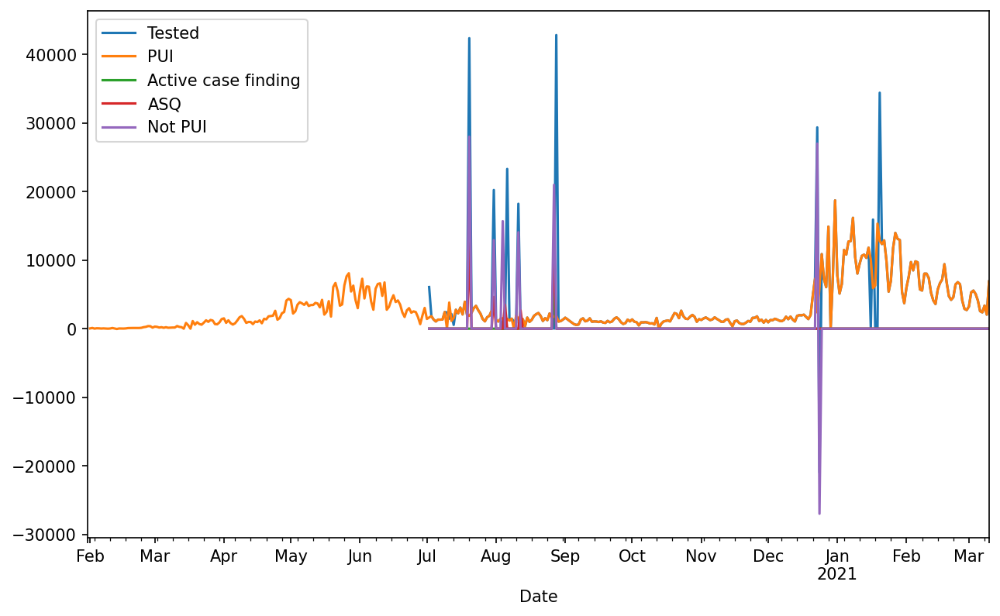

In [21]:
%matplotlib inline

# wider notebook
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

# larger plot
plt.rcParams['figure.figsize'] = [10, 6]
plt.rcParams['figure.dpi'] = 150

situation.plot();

# but...
- this data looks a bit weird

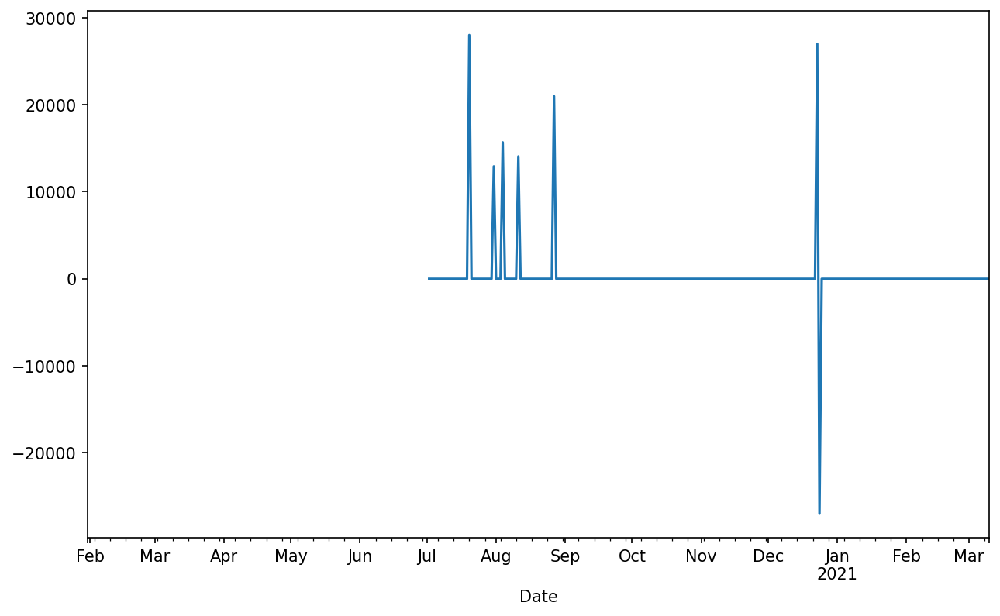

In [22]:
situation['Not PUI'].plot();

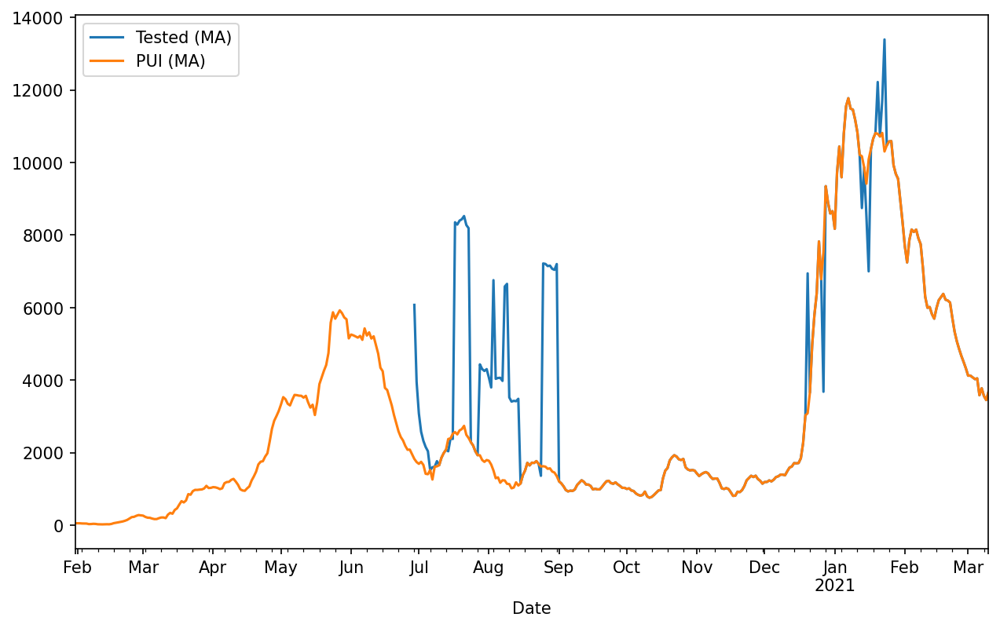

In [23]:
df = situation
df['Tested (MA)'] = df['Tested'].rolling(7, 1, center=True).mean()
df['PUI (MA)'] = df['PUI'].rolling(7, 1, center=True).mean()
df[['Tested (MA)','PUI (MA)']].plot();

# "Total laboratory tests"
- isn't
- daily's same as PUI + some mid years
- Total People Tested?

#  Positive Rate
- aka Positivity aka Detection Rate
- Positive Test Results / All Tests Results
- over %3 - Not testing enough (WHO)
- under %3 - Maybe testing enough

# Cases
https://data.go.th/en/dataset/covid-19-daily
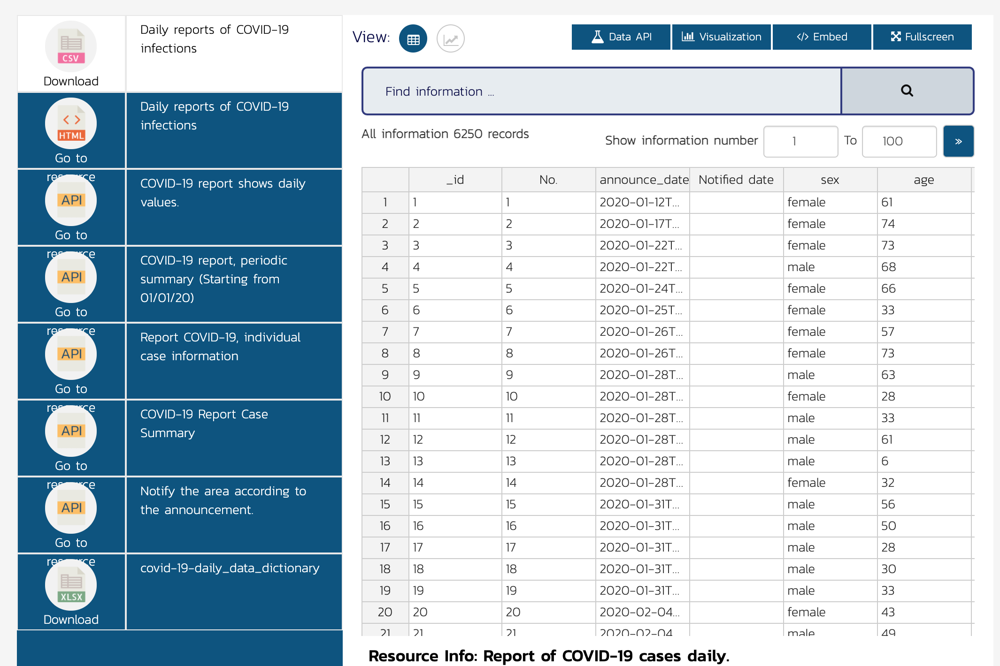

In [24]:
def get_cases():
    timeline = s.get("https://covid19.th-stat.com/api/open/timeline").json()["Data"]
    results = []
    for d in timeline:
        date = datetime.datetime.strptime(d["Date"], "%m/%d/%Y")
        cases = d["NewConfirmed"]
        results.append((date, cases))
    data = pd.DataFrame(results, columns=["Date", "Cases"]).set_index("Date")
    return data

In [25]:
cases = get_cases()
cases

,Cases
Date,
2020-01-01,0
2020-01-02,0
2020-01-03,0
2020-01-04,0
2020-01-05,0
...,...
2021-03-07,65
2021-03-08,71
2021-03-09,60


In [26]:
df = df.combine_first(cases)
df   

,ASQ,Active case finding,Cases,Not PUI,PUI,PUI (MA),Tested,Tested (MA)
Date,,,,,,,,
2020-01-01,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
2020-01-02,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
2020-01-03,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
2020-01-04,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
2020-01-05,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
2021-03-07,0.0,0.0,65.0,0.0,2379.0,3774.00,2379.0,3774.00
2021-03-08,0.0,0.0,71.0,0.0,3373.0,3559.00,3373.0,3559.00
2021-03-09,0.0,0.0,60.0,0.0,2052.0,3449.00,2052.0,3449.00


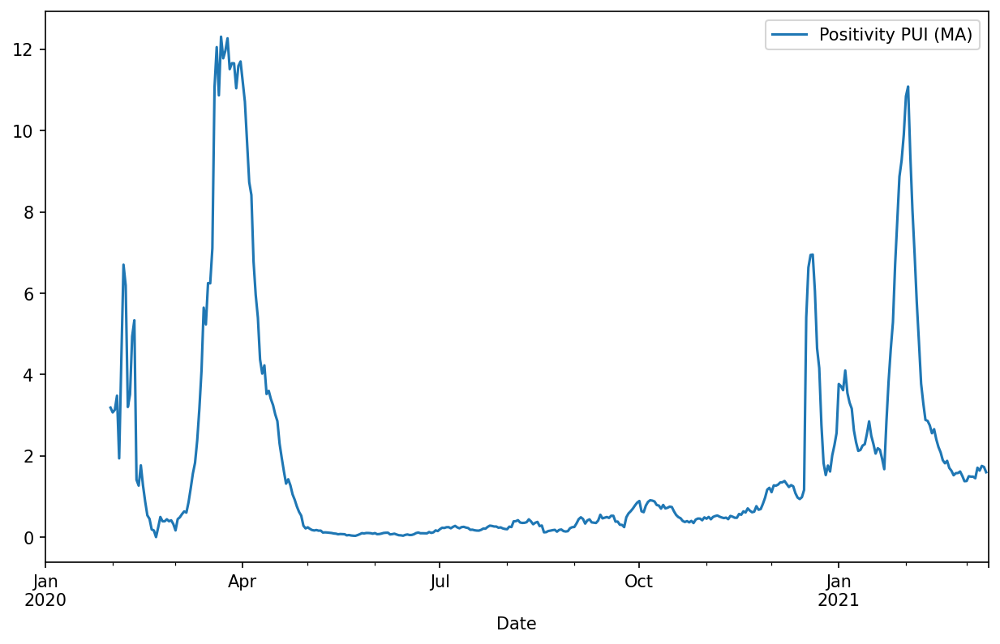

In [27]:
df["Cases (MA)"] = df["Cases"].rolling(7, 1, center=True).mean()
df["Positivity PUI (MA)"] = df["Cases (MA)"] / df["PUI (MA)"] * 100
df.plot(y=["Positivity PUI (MA)"]);

# but... 
- PUI != test
- doesn't include
    - Private tests
    - "Active testing"
    - ?
- but is it an upper bound?

# Then the tests came back...
- https://service.dmsc.moph.go.th/labscovid19/indexen.php
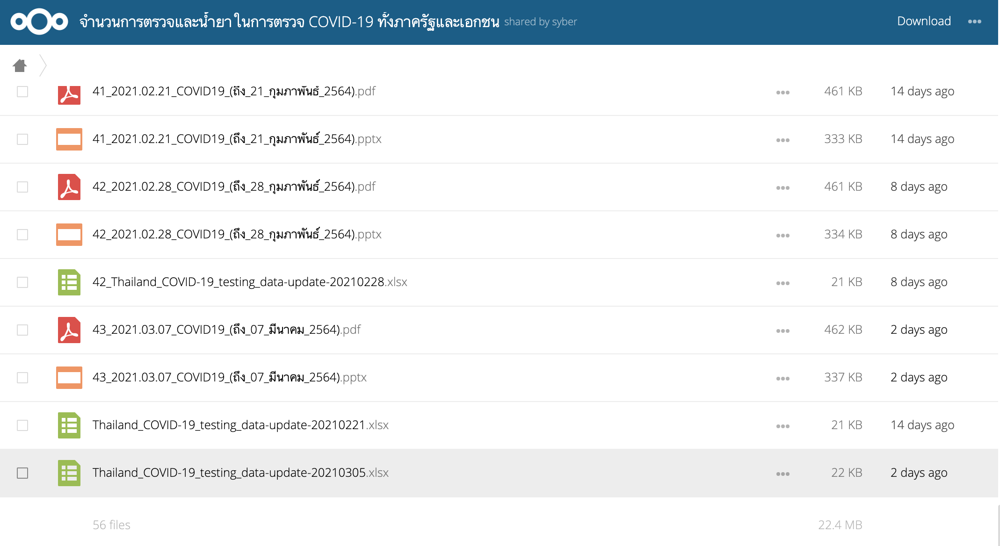

# but...
- It's JS not HTML
- It's WebDAV

In [28]:
from webdav3.client import Client
options = {
    "webdav_hostname": "http://nextcloud.dmsc.moph.go.th/public.php/webdav",
    "webdav_login": "wbioWZAQfManokc",
    "webdav_password": "null",
}
client = Client(options)
client.list()

['webdav/',
 '10_21_06_2020_COVID19_(ถึง_19_มิถุนายน_2563)_V2.pdf',
 '11_28_06_2020_COVID19_(ถึง_26_มิถุนายน_2563).pdf',
 '12_03_07_2020_COVID19_(ถึง_27_กรกฎาคม_2563).pdf',
 '13_12_07_2020_COVID19_(ถึง_10_กรกฎาคม_2563).pdf',
 '14_19_07_2020_COVID19_(ถึง_17_กรกฎาคม_2563).pdf',
 '15_26_07_2020_COVID19_(ถึง_24_กรกฎาคม_2563)_2.pdf',
 '16_2_08_2020_COVID19_(ถึง_31_กรกฎาคม_2563).pdf',
 '17_09_08_2020_COVID19_(ถึง_7_สิงหาคม_2563).pdf',
 '18_16_08_2020_COVID19_(ถึง_14_สิงหาคม_2563).pdf',
 '19_24_08_2020_COVID19_(ถึง_21_สิงหาคม_2563).pdf',
 '1_19_04_2020_COVID19_(ถึง_17_เมษายน_2563)_V2.pdf',
 '20_31_08_2020_COVID19_(ถึง_28_สิงหาคม_2563).pdf',
 '21_06_09_2020_COVID19_(ถึง_4_กันยายน_2563)_1.pdf',
 '22_13_09_2020_COVID19_(ถึง_11_กันยายน_2563).pdf',
 '23_13_09_2020_COVID19_(ถึง_18_กันยายน_2563).pdf',
 '24_27_09_2020_COVID19_(ถึง_25_กันยายน_2563).pdf',
 '25_04_10_2020_COVID19_(ถึง_2_ตุลาคม_2563).pdf',
 '26_12_10_2020_COVID19_(ถึง_9_ตุลาคม_2563).pdf',
 '27_19_10_2020_COVID19_(ถึง_16_ตุลาคม_2563).pdf'

In [29]:
client.download_file("Thailand_COVID-19_testing_data-update-20210305.xlsx", 
                     "testing_moph/Thailand_COVID-19_testing_data-update-20210305.xlsx"
                    )
pd.read_excel("testing_moph/Thailand_COVID-19_testing_data-update-20210305.xlsx", parse_dates=True, usecols=[0, 1, 2])

,Date,Pos,Total
0,Cannot specify date,2963.0,32131.0
1,2020-01-01 00:00:00,0.0,0.0
2,2020-01-02 00:00:00,0.0,0.0
3,2020-01-03 00:00:00,0.0,0.0
4,2020-01-04 00:00:00,0.0,2.0
...,...,...,...
432,2021-03-07 00:00:00,73.0,8254.0
433,NaN,NaN,NaN
434,NaN,NaN,NaN
435,NaN,NaN,NaN


# but...
- What's this "Cannot specify date"?

 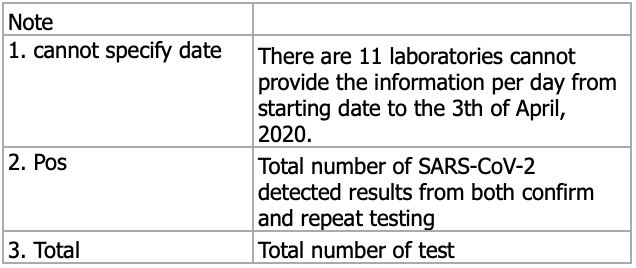

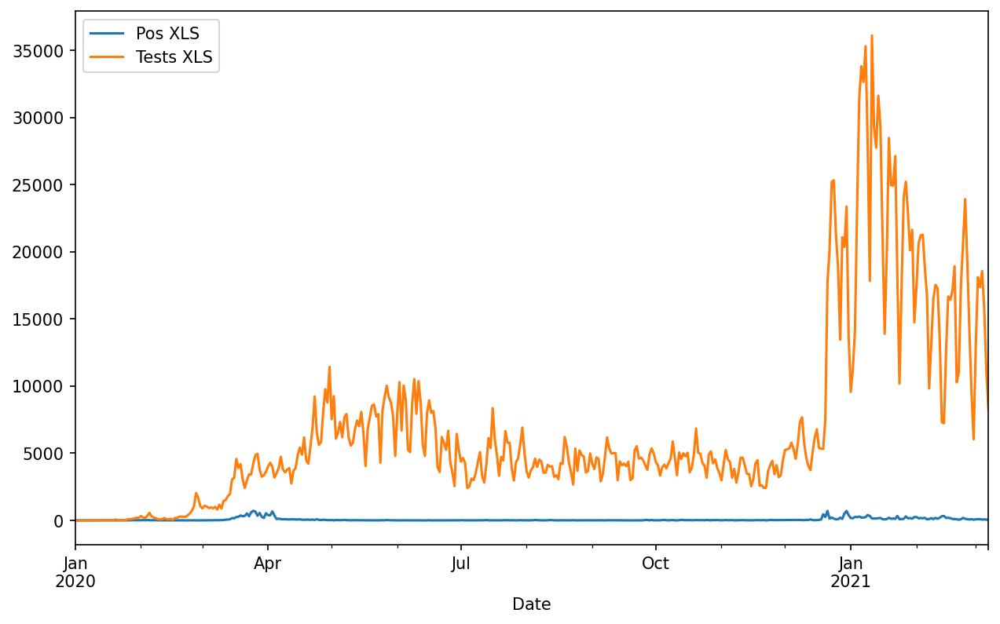

In [30]:
tests = pd.read_excel("testing_moph/Thailand_COVID-19_testing_data-update-20210305.xlsx", parse_dates=True, usecols=[0, 1, 2])

tests.dropna(how="any", inplace=True)  # get rid of totals row
tests = tests.set_index("Date")
pos = tests.loc["Cannot specify date"].Pos
total = tests.loc["Cannot specify date"].Total
tests.drop("Cannot specify date", inplace=True)
# Need to redistribute the unknown values across known values
# Documentation tells us it was 11 labs and only before 3 April
# TODO: still doesn't redistribute all missing values due to rounding. about 200 left
unknown_end_date = datetime.datetime(day=3, month=4, year=2020)
all_pos = tests["Pos"][:unknown_end_date].sum()
all_total = tests["Total"][:unknown_end_date].sum()
for index, row in tests.iterrows():
    if index > unknown_end_date:
        continue
    row.Pos = float(row.Pos) + row.Pos / all_pos * pos
    row.Total = float(row.Total) + row.Total / all_total * total
# fix datetime
tests.reset_index(drop=False, inplace=True)
tests["Date"] = pd.to_datetime(tests["Date"])
tests.set_index("Date", inplace=True)
tests.rename(columns=dict(Pos="Pos XLS", Total="Tests XLS"), inplace=True)
tests.plot();

# but...
- doesn't seem to match our PUI and Cases data

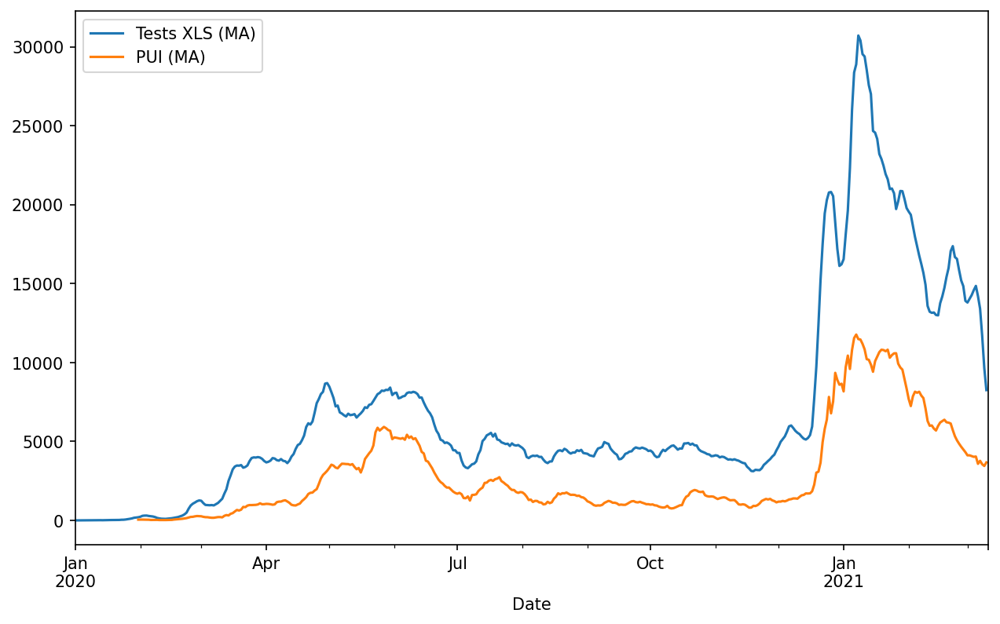

In [31]:
df = df.combine_first(tests)
df["Tests XLS (MA)"] = df["Tests XLS"].rolling(7, 1, center=True).mean()
df["Pos XLS (MA)"] = df["Pos XLS"].rolling(7, 1, center=True).mean()
df.plot(y=["Tests XLS (MA)", "PUI (MA)"]);

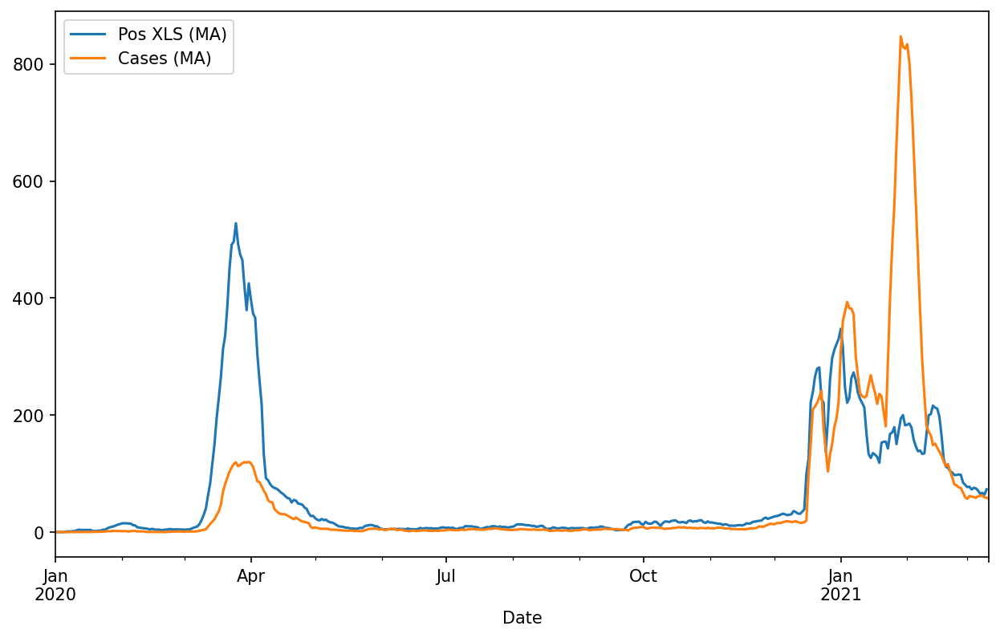

In [32]:
df.plot(y=["Pos XLS (MA)", "Cases (MA)"]);

# Missing Tests
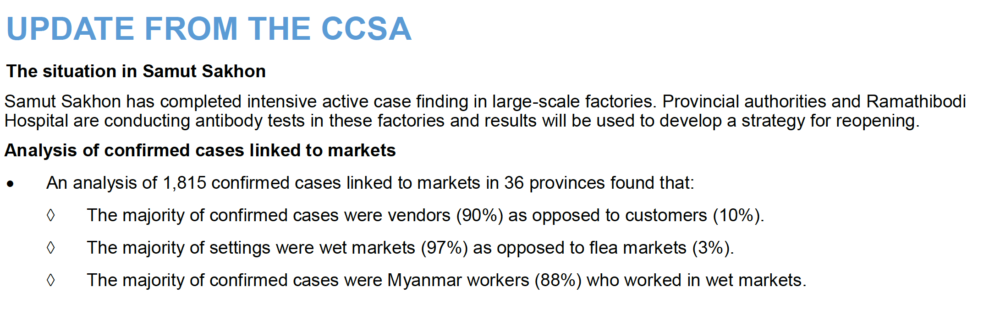


# Finally positive rate
Even if it's not accurate

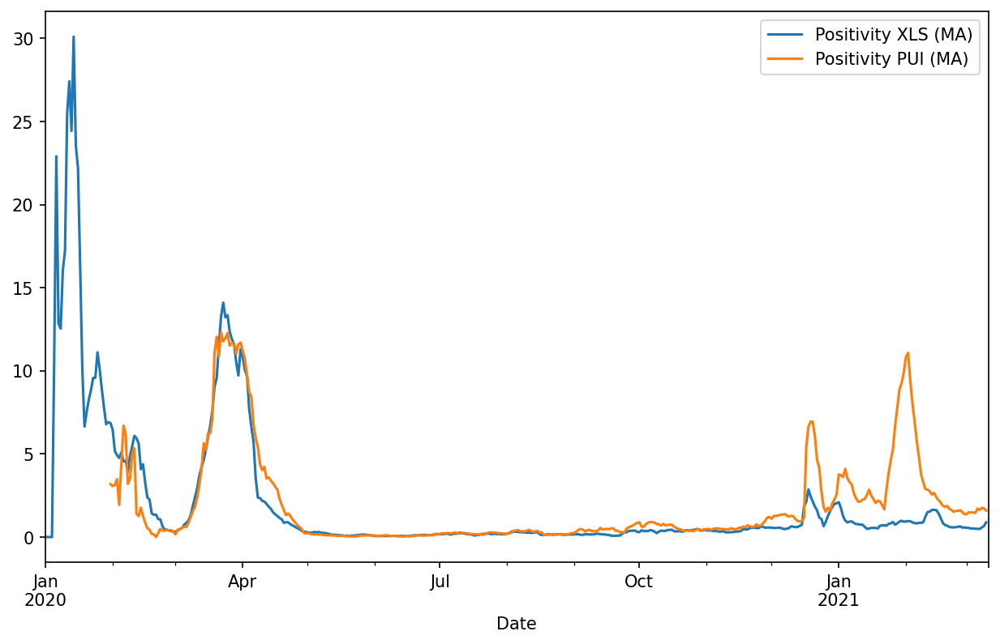

In [33]:
df["Positivity XLS (MA)"] = df["Pos XLS (MA)"] / df["Tests XLS (MA)"] * 100
df.plot(y=["Positivity XLS (MA)","Positivity PUI (MA)"]);

# but...
- Are there other tests missing (other than anti-body tests)?

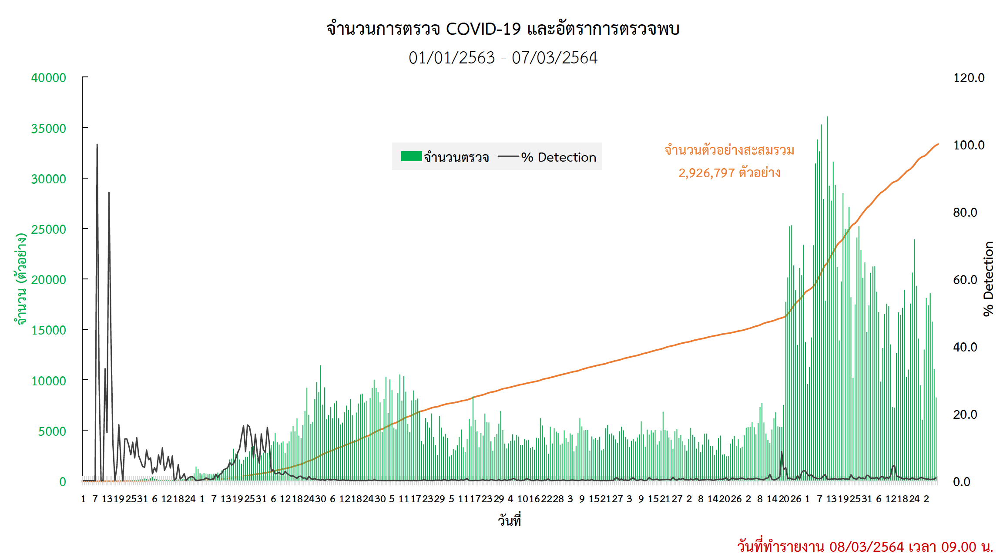

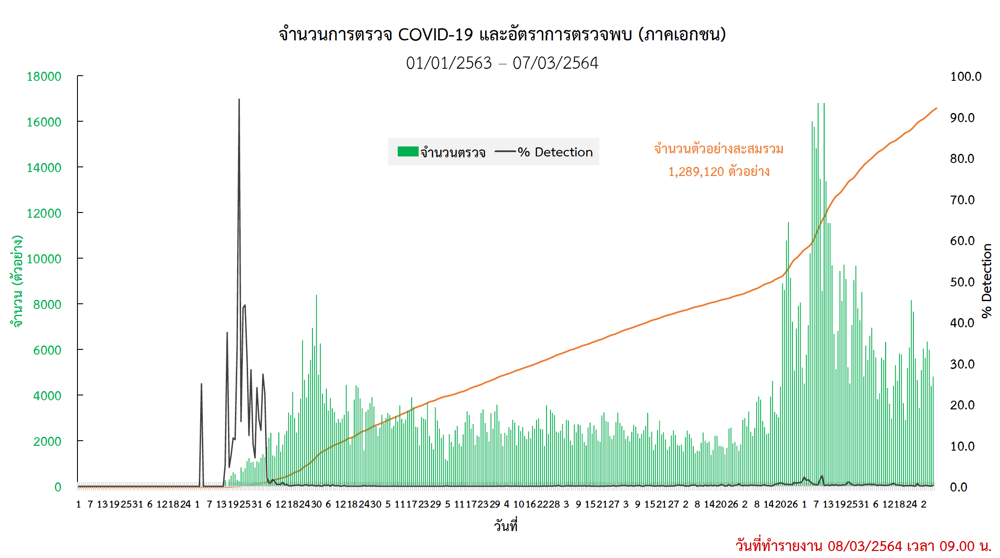

# How hard could PPTX be?
or PDFs of PPTX

In [35]:
from pptx import Presentation
file = next(dav_files(
        "http://nextcloud.dmsc.moph.go.th/public.php/webdav",
        "wbioWZAQfManokc",
        "null",
        ext=".pptx",
        dir="testing_moph",
    ))
prs = Presentation(file)
list(chart for slide in prs.slides for chart in slide2chartdata(slide))

[(<pptx.chart.chart.Chart at 0x123d93d80>,
  'จำนวนตัวอย่างที่ได้รับการตรวจ COVID-19 RT-PCR\n01/03/2564 - 07/03/2564',
  datetime.datetime(2021, 3, 1, 0, 0),
  datetime.datetime(2021, 3, 7, 0, 0),
  {'กรมการแพทย์ ': (746.0,),
   'จุฬาลงกรณ์มหาวิทยาลัย': (1027.0,),
   'คณะแพทย์ศาสตร์ ศิริราชพยาบาล': (1726.0,),
   'มหาวิทยาลัยอื่นๆ': (2492.0,),
   'คณะแพทย์ศาสตร์ รพ.รามาธิบดี': (2755.0,),
   'อื่นๆ': (3953.0,),
   'กรมวิทยาศาสตร์การแพทย์': (7624.0,),
   'กรมควบคุมโรค': (8310.0,),
   'กระทรวงสาธารณสุข': (35193.0,),
   'เอกชน': (38298.0,)}),
 (<pptx.chart.chart.Chart at 0x123f34040>,
  'จำนวนการตรวจ COVID-19 และอัตราการตรวจพบ (เขตสุขภาพ)\n01/03/2564 - 07/03/2564\n',
  datetime.datetime(2021, 3, 1, 0, 0),
  datetime.datetime(2021, 3, 7, 0, 0),
  {'จำนวนผลบวก': (34.0,
    27.0,
    3.0,
    133.0,
    36.0,
    217.0,
    0.0,
    0.0,
    4.0,
    0.0,
    1.0,
    15.0,
    59.0),
   'จำนวนตรวจ': (6170.0,
    3789.0,
    689.0,
    17356.0,
    8279.0,
    15906.0,
    2370.0,
    2592.0,


In [ ]:
def slide2chartdata(slide):
    for shape in slide.shapes:
        if not shape.has_chart:
            continue
        chart = shape.chart
        if chart is None:
            continue
        title = chart.chart_title.text_frame.text if chart.has_title else ""
        start, end = find_date_range(title)
        if start is None:
            continue
        series = dict([(s.name, s.values) for s in chart.series])

        yield chart, title, start, end, series

In [36]:
tests_priv = get_tests_private_public()
tests_priv

            Tests Public  % Detection  Pos Public
Date                                             
2020-01-01           0.0     0.000000         0.0
2020-01-02           0.0     0.000000         0.0
2020-01-03           0.0     0.000000         0.0
2020-01-04           2.0     0.000000         0.0
2020-01-05           2.0     0.000000         0.0
...                  ...          ...         ...
2021-03-03       17366.0     0.535529        93.0
2021-03-04       18576.0     0.328381        61.0
2021-03-05       15761.0     0.463169        73.0
2021-03-06       11063.0     0.497153        55.0
2021-03-07        8254.0     0.884420        73.0

[432 rows x 3 columns]
            Tests Private  % Detection  Pos Private
Date                                               
2020-01-01            0.0     0.000000          0.0
2020-01-02            0.0     0.000000          0.0
2020-01-03            0.0     0.000000          0.0
2020-01-04            0.0     0.000000          0.0
2020-01-05    

            Tests Public  % Detection  Pos Public
Date                                             
2020-01-01           0.0     0.000000         0.0
2020-01-02           0.0     0.000000         0.0
2020-01-03           0.0     0.000000         0.0
2020-01-04           2.0     0.000000         0.0
2020-01-05           2.0     0.000000         0.0
...                  ...          ...         ...
2020-12-28       19217.0     0.442317        85.0
2020-12-29       17569.0     2.595481       456.0
2020-12-30       19905.0     3.325798       662.0
2020-12-31       10875.0     3.365517       366.0
2021-01-01        7229.0     2.130308       154.0

[367 rows x 3 columns]
            Tests Private  % Detection  Pos Private
Date                                               
2020-01-01            0.0     0.000000          0.0
2020-01-02            0.0     0.000000          0.0
2020-01-03            0.0     0.000000          0.0
2020-01-04            0.0     0.000000          0.0
2020-01-05    

,% Detection,Pos Private,Pos Public,Tests Private,Tests Public
Date,,,,,
2020-01-01,0.000000,0.0,0.0,0.0,0.0
2020-01-02,0.000000,0.0,0.0,0.0,0.0
2020-01-03,0.000000,0.0,0.0,0.0,0.0
2020-01-04,0.000000,0.0,0.0,0.0,2.0
2020-01-05,0.000000,0.0,0.0,0.0,2.0
...,...,...,...,...,...
2021-03-03,0.535529,12.0,93.0,5630.0,17366.0
2021-03-04,0.328381,11.0,61.0,6342.0,18576.0
2021-03-05,0.463169,4.0,73.0,5988.0,15761.0


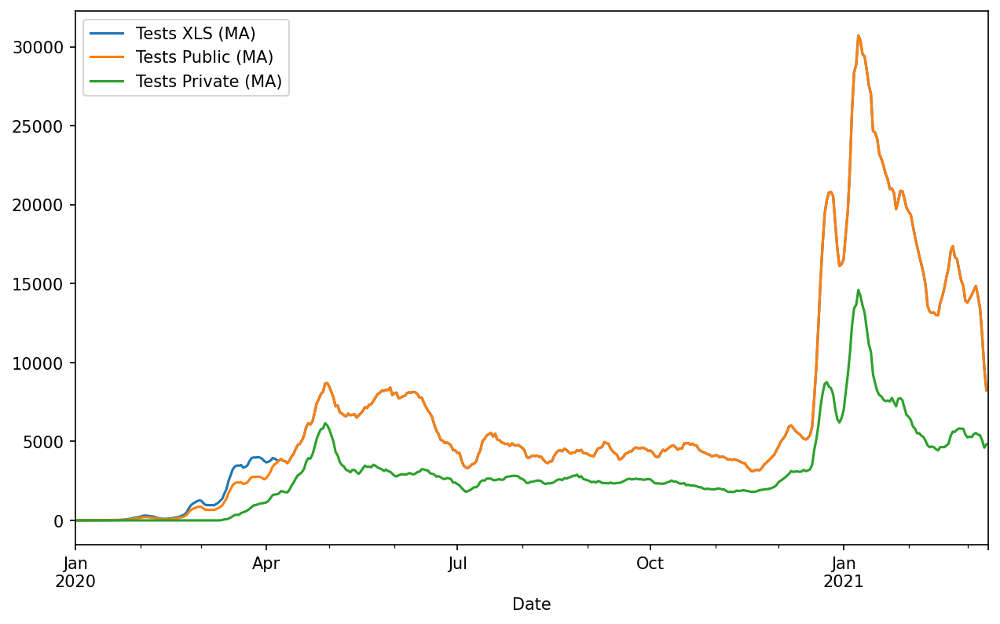

In [37]:
df = df.combine_first(tests_priv)
df["Tests Public (MA)"] = df["Tests Public"].rolling(7, 1, center=True).mean()
df["Tests Private (MA)"] = df["Tests Private"].rolling(7, 1, center=True).mean()
df.plot(y=["Tests XLS (MA)","Tests Public (MA)", "Tests Private (MA)"]);

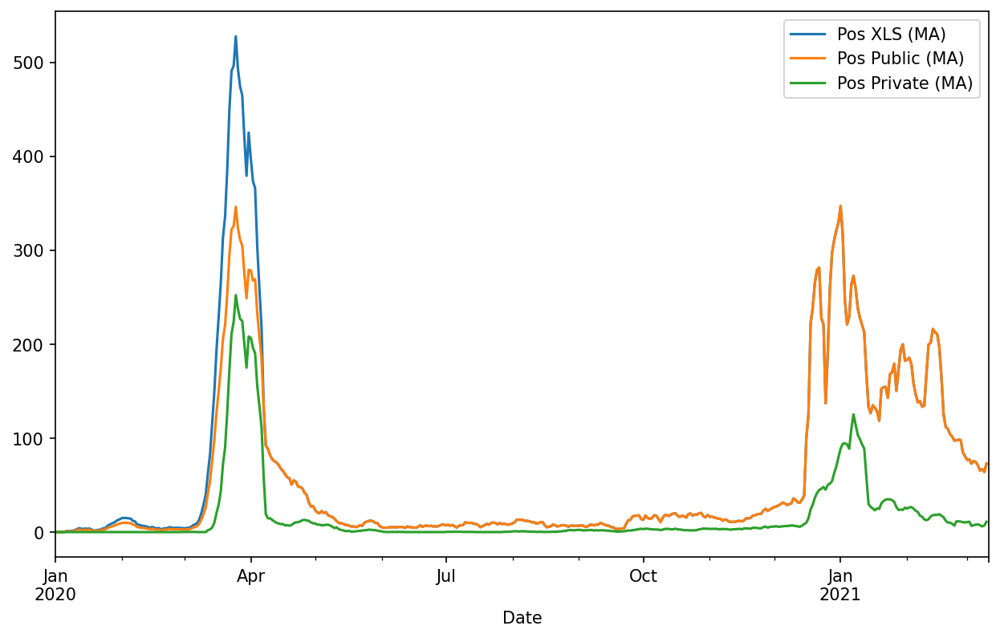

In [38]:
df["Pos Public (MA)"] = df["Pos Public"].rolling(7, 1, center=True).mean()
df["Pos Private (MA)"] = df["Pos Private"].rolling(7, 1, center=True).mean()
df.plot(y=["Pos XLS (MA)","Pos Public (MA)", "Pos Private (MA)"]);

# Should positive rate include private tests?
Trick Question: I don't know

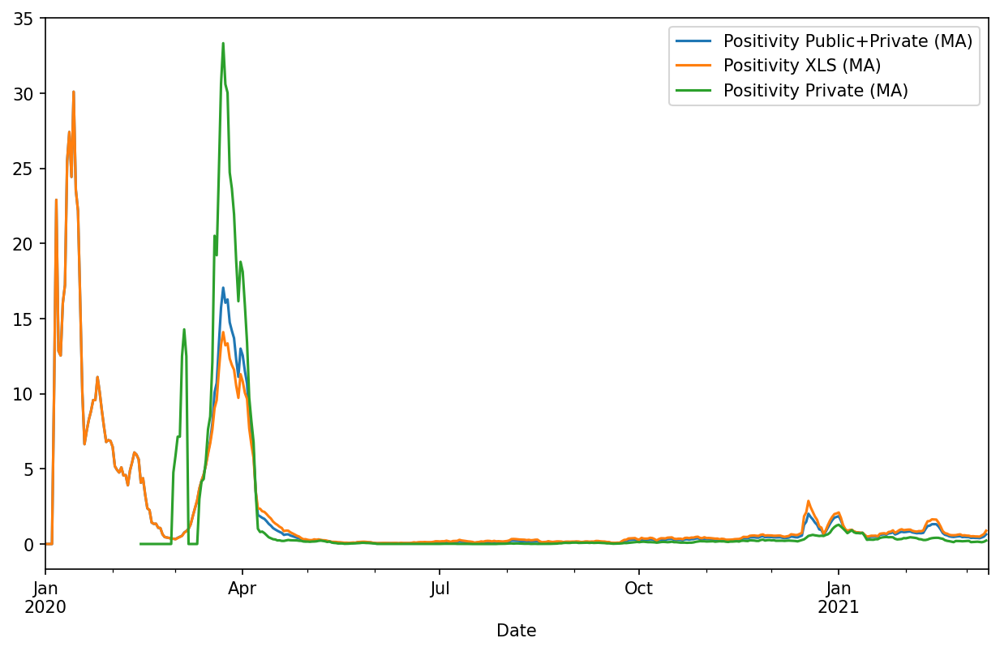

In [39]:
df["Pos Public (MA)"] = df["Pos Public"].rolling(7, 1, center=True).mean()
df["Pos Private (MA)"] = df["Pos Private"].rolling(7, 1, center=True).mean()
df["Tests Public (MA)"] = df["Tests Public"].rolling(7, 1, center=True).mean()
df["Tests Private (MA)"] = df["Tests Private"].rolling(7, 1, center=True).mean()

df["Pos Corrected+Private (MA)"] = df["Pos Private (MA)"] + df["Pos XLS (MA)"]
df["Tests Private+Public (MA)"] = df["Tests Public (MA)"] + df["Tests Private (MA)"]
df["Tests Corrected+Private (MA)"] = df["Tests XLS (MA)"] + df["Tests Private (MA)"]


df["Positivity Private (MA)"] = (
    df["Pos Private (MA)"] / df["Tests Private (MA)"] * 100
)
df["Positivity Public+Private (MA)"] = (
    df["Pos Corrected+Private (MA)"] / df["Tests Corrected+Private (MA)"] * 100
)

df.plot(y=["Positivity Public+Private (MA)","Positivity XLS (MA)","Positivity Private (MA)"]);

# Problems with Positive Rate
- Assumes infected are equally likely to be tested
- Migrants without health insurance or visa
- Work pressure
- Does it matter where you live?
   - "Are they just testing Migrants in Factories?"

# but...
There were more charts in those weeky PPTX

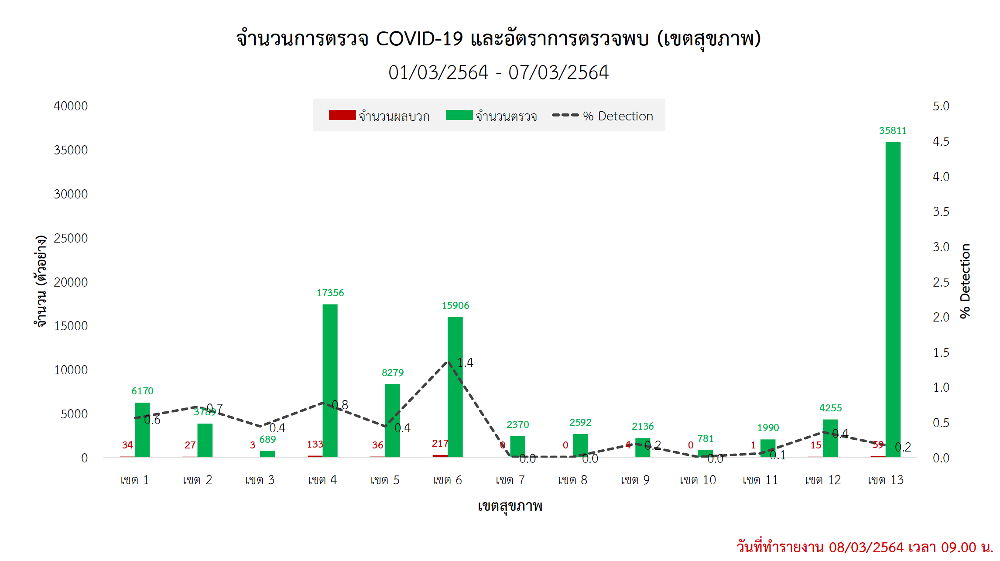

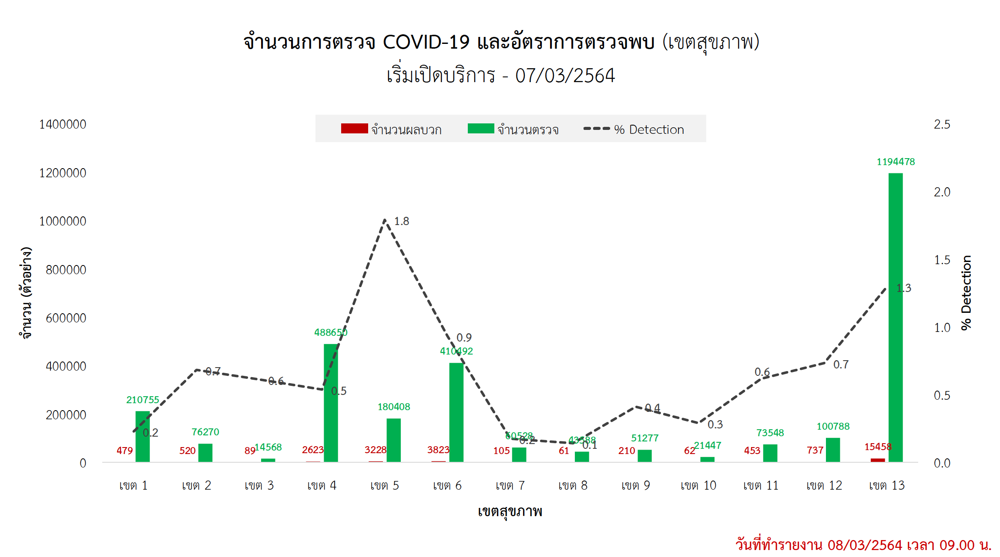

In [40]:
tests_by_area = get_tests_by_area() # Both pptx and pdfs

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2021-03-01    4.857143    3.857143    0.428571        19.0    5.142857   
2021-03-02    4.857143    3.857143    0.428571        19.0    5.142857   
2021-03-03    4.857143    3.857143    0.428571        19.0    5.142857   
2021-03-04    4.857143    3.857143    0.428571        19.0    5.142857   
2021-03-05    4.857143    3.857143    0.428571        19.0    5.142857   
2021-03-06    4.857143    3.857143    0.428571        19.0    5.142857   
2021-03-07    4.857143    3.857143    0.428571        19.0    5.142857   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2021-03-01        31.0         0.0         0.0    0.571429          0.0  ...   
2021-03-02        31.0         0.0         0.0    0.571429          0.0  ...   
2021-03-03   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2021-02-01    5.571429         5.0    0.285714   14.857143        63.0   
2021-02-02    5.571429         5.0    0.285714   14.857143        63.0   
2021-02-03    5.571429         5.0    0.285714   14.857143        63.0   
2021-02-04    5.571429         5.0    0.285714   14.857143        63.0   
2021-02-05    5.571429         5.0    0.285714   14.857143        63.0   
2021-02-06    5.571429         5.0    0.285714   14.857143        63.0   
2021-02-07    5.571429         5.0    0.285714   14.857143        63.0   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2021-02-01   35.142857    0.285714    0.142857    0.285714          0.0  ...   
2021-02-02   35.142857    0.285714    0.142857    0.285714          0.0  ...   
2021-02-03   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2020-12-19    0.857143    1.857143    2.285714    6.571429   13.857143   
2020-12-20    0.857143    1.857143    2.285714    6.571429   13.857143   
2020-12-21    0.857143    1.857143    2.285714    6.571429   13.857143   
2020-12-22    0.857143    1.857143    2.285714    6.571429   13.857143   
2020-12-23    0.857143    1.857143    2.285714    6.571429   13.857143   
2020-12-24    0.857143    1.857143    2.285714    6.571429   13.857143   
2020-12-25    0.857143    1.857143    2.285714    6.571429   13.857143   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2020-12-19   18.142857    0.428571    0.428571    0.857143     0.142857  ...   
2020-12-20   18.142857    0.428571    0.428571    0.857143     0.142857  ...   
2020-12-21   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2020-11-07         0.0    0.571429         0.0         0.0         0.0   
2020-11-08         0.0    0.571429         0.0         0.0         0.0   
2020-11-09         0.0    0.571429         0.0         0.0         0.0   
2020-11-10         0.0    0.571429         0.0         0.0         0.0   
2020-11-11         0.0    0.571429         0.0         0.0         0.0   
2020-11-12         0.0    0.571429         0.0         0.0         0.0   
2020-11-13         0.0    0.571429         0.0         0.0         0.0   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2020-11-07    3.714286         0.0         0.0         0.0          0.0  ...   
2020-11-08    3.714286         0.0         0.0         0.0          0.0  ...   
2020-11-09   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2020-10-17         0.0         0.0         0.0    0.428571         0.0   
2020-10-18         0.0         0.0         0.0    0.428571         0.0   
2020-10-19         0.0         0.0         0.0    0.428571         0.0   
2020-10-20         0.0         0.0         0.0    0.428571         0.0   
2020-10-21         0.0         0.0         0.0    0.428571         0.0   
2020-10-22         0.0         0.0         0.0    0.428571         0.0   
2020-10-23         0.0         0.0         0.0    0.428571         0.0   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2020-10-17    4.714286         0.0         0.0         0.0          0.0  ...   
2020-10-18    4.714286         0.0         0.0         0.0          0.0  ...   
2020-10-19   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2020-08-29         0.0         0.0         0.0         0.0    0.142857   
2020-08-30         0.0         0.0         0.0         0.0    0.142857   
2020-08-31         0.0         0.0         0.0         0.0    0.142857   
2020-09-01         0.0         0.0         0.0         0.0    0.142857   
2020-09-02         0.0         0.0         0.0         0.0    0.142857   
2020-09-03         0.0         0.0         0.0         0.0    0.142857   
2020-09-04         0.0         0.0         0.0         0.0    0.142857   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2020-08-29    1.285714         0.0         0.0         0.0          0.0  ...   
2020-08-30    1.285714         0.0         0.0         0.0          0.0  ...   
2020-08-31   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2020-09-19         0.0         0.0         0.0         0.0         0.0   
2020-09-20         0.0         0.0         0.0         0.0         0.0   
2020-09-21         0.0         0.0         0.0         0.0         0.0   
2020-09-22         0.0         0.0         0.0         0.0         0.0   
2020-09-23         0.0         0.0         0.0         0.0         0.0   
2020-09-24         0.0         0.0         0.0         0.0         0.0   
2020-09-25         0.0         0.0         0.0         0.0         0.0   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2020-09-19    1.857143         0.0         0.0         0.0          0.0  ...   
2020-09-20    1.857143         0.0         0.0         0.0          0.0  ...   
2020-09-21   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2020-06-20         0.0         0.0         0.0         0.0         0.0   
2020-06-21         0.0         0.0         0.0         0.0         0.0   
2020-06-22         0.0         0.0         0.0         0.0         0.0   
2020-06-23         0.0         0.0         0.0         0.0         0.0   
2020-06-24         0.0         0.0         0.0         0.0         0.0   
2020-06-25         0.0         0.0         0.0         0.0         0.0   
2020-06-26         0.0         0.0         0.0         0.0         0.0   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2020-06-20    2.142857         0.0         0.0    0.142857          0.0  ...   
2020-06-21    2.142857         0.0         0.0    0.142857          0.0  ...   
2020-06-22   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2020-07-18         0.0         0.0         0.0         0.0         0.0   
2020-07-19         0.0         0.0         0.0         0.0         0.0   
2020-07-20         0.0         0.0         0.0         0.0         0.0   
2020-07-21         0.0         0.0         0.0         0.0         0.0   
2020-07-22         0.0         0.0         0.0         0.0         0.0   
2020-07-23         0.0         0.0         0.0         0.0         0.0   
2020-07-24         0.0         0.0         0.0         0.0         0.0   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2020-07-18    3.285714         0.0         0.0         0.0          0.0  ...   
2020-07-19    3.285714         0.0         0.0         0.0          0.0  ...   
2020-07-20   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2020-08-15         0.0         0.0         0.0         0.0         0.0   
2020-08-16         0.0         0.0         0.0         0.0         0.0   
2020-08-17         0.0         0.0         0.0         0.0         0.0   
2020-08-18         0.0         0.0         0.0         0.0         0.0   
2020-08-19         0.0         0.0         0.0         0.0         0.0   
2020-08-20         0.0         0.0         0.0         0.0         0.0   
2020-08-21         0.0         0.0         0.0         0.0         0.0   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2020-08-15         4.0         0.0         0.0         0.0          0.0  ...   
2020-08-16         4.0         0.0         0.0         0.0          0.0  ...   
2020-08-17   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2020-04-04    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-05    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-06    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-07    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-08    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-09    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-10    1.142857    0.571429         1.0    3.714286    3.714286   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2020-04-04    3.285714         0.0    0.857143    3.571429          0.0  ...   
2020-04-05    3.285714         0.0    0.857143    3.571429          0.0  ...   
2020-04-06   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2020-04-04    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-05    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-06    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-07    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-08    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-09    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-10    1.142857    0.571429         1.0    3.714286    3.714286   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2020-04-04    3.285714         0.0    0.857143    3.571429          0.0  ...   
2020-04-05    3.285714         0.0    0.857143    3.571429          0.0  ...   
2020-04-06   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2020-04-04    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-05    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-06    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-07    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-08    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-09    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-10    1.142857    0.571429         1.0    3.714286    3.714286   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2020-04-04    3.285714         0.0    0.857143    3.571429          0.0  ...   
2020-04-05    3.285714         0.0    0.857143    3.571429          0.0  ...   
2020-04-06   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2020-04-04    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-05    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-06    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-07    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-08    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-09    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-10    1.142857    0.571429         1.0    3.714286    3.714286   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2020-04-04    3.285714         0.0    0.857143    3.571429          0.0  ...   
2020-04-05    3.285714         0.0    0.857143    3.571429          0.0  ...   
2020-04-06   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2020-04-04    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-05    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-06    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-07    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-08    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-09    1.142857    0.571429         1.0    3.714286    3.714286   
2020-04-10    1.142857    0.571429         1.0    3.714286    3.714286   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2020-04-04    3.285714         0.0    0.857143    3.571429          0.0  ...   
2020-04-05    3.285714         0.0    0.857143    3.571429          0.0  ...   
2020-04-06   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2020-05-23    0.142857         0.0         0.0   13.714286         0.0   
2020-05-24    0.142857         0.0         0.0   13.714286         0.0   
2020-05-25    0.142857         0.0         0.0   13.714286         0.0   
2020-05-26    0.142857         0.0         0.0   13.714286         0.0   
2020-05-27    0.142857         0.0         0.0   13.714286         0.0   
2020-05-28    0.142857         0.0         0.0   13.714286         0.0   
2020-05-29    0.142857         0.0         0.0   13.714286         0.0   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2020-05-23    3.285714         0.0         0.0    0.285714          0.0  ...   
2020-05-24    3.285714         0.0         0.0    0.285714          0.0  ...   
2020-05-25   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2021-03-01    4.857143    3.857143    0.428571        19.0    5.142857   
2021-03-02    4.857143    3.857143    0.428571        19.0    5.142857   
2021-03-03    4.857143    3.857143    0.428571        19.0    5.142857   
2021-03-04    4.857143    3.857143    0.428571        19.0    5.142857   
2021-03-05    4.857143    3.857143    0.428571        19.0    5.142857   
2021-03-06    4.857143    3.857143    0.428571        19.0    5.142857   
2021-03-07    4.857143    3.857143    0.428571        19.0    5.142857   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2021-03-01        31.0         0.0         0.0    0.571429          0.0  ...   
2021-03-02        31.0         0.0         0.0    0.571429          0.0  ...   
2021-03-03   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2021-02-08    5.571429    4.857143    0.285714        15.0   71.857143   
2021-02-09    5.571429    4.857143    0.285714        15.0   71.857143   
2021-02-10    5.571429    4.857143    0.285714        15.0   71.857143   
2021-02-11    5.571429    4.857143    0.285714        15.0   71.857143   
2021-02-12    5.571429    4.857143    0.285714        15.0   71.857143   
2021-02-13    5.571429    4.857143    0.285714        15.0   71.857143   
2021-02-14    5.571429    4.857143    0.285714        15.0   71.857143   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2021-02-08   35.142857    0.285714    0.142857    0.428571          0.0  ...   
2021-02-09   35.142857    0.285714    0.142857    0.428571          0.0  ...   
2021-02-10   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2020-12-26    0.714286    2.714286    0.142857    5.857143        17.0   
2020-12-27    0.714286    2.714286    0.142857    5.857143        17.0   
2020-12-28    0.714286    2.714286    0.142857    5.857143        17.0   
2020-12-29    0.714286    2.714286    0.142857    5.857143        17.0   
2020-12-30    0.714286    2.714286    0.142857    5.857143        17.0   
2020-12-31    0.714286    2.714286    0.142857    5.857143        17.0   
2021-01-01    0.714286    2.714286    0.142857    5.857143        17.0   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2020-12-26   44.714286         0.0         0.0    0.857143     0.285714  ...   
2020-12-27   44.714286         0.0         0.0    0.857143     0.285714  ...   
2020-12-28   

            Pos Area 1  Pos Area 2  Pos Area 3  Pos Area 4  Pos Area 5  \
Date                                                                     
2020-12-05         7.0         0.0         0.0         0.0         0.0   
2020-12-06         7.0         0.0         0.0         0.0         0.0   
2020-12-07         7.0         0.0         0.0         0.0         0.0   
2020-12-08         7.0         0.0         0.0         0.0         0.0   
2020-12-09         7.0         0.0         0.0         0.0         0.0   
2020-12-10         7.0         0.0         0.0         0.0         0.0   
2020-12-11         7.0         0.0         0.0         0.0         0.0   

            Pos Area 6  Pos Area 7  Pos Area 8  Pos Area 9  Pos Area 10  ...  \
Date                                                                     ...   
2020-12-05    9.428571         0.0         0.0    0.142857          0.0  ...   
2020-12-06    9.428571         0.0         0.0    0.142857          0.0  ...   
2020-12-07   

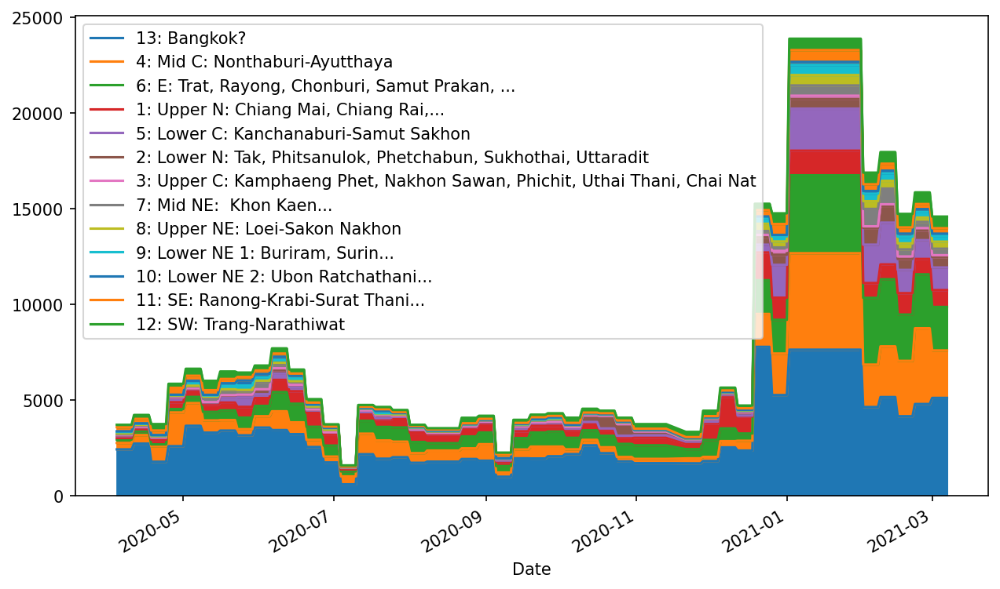

In [41]:
tests_by_area.plot.area(y=TESTS_AREA_SERIES).legend(AREA_LEGEND);

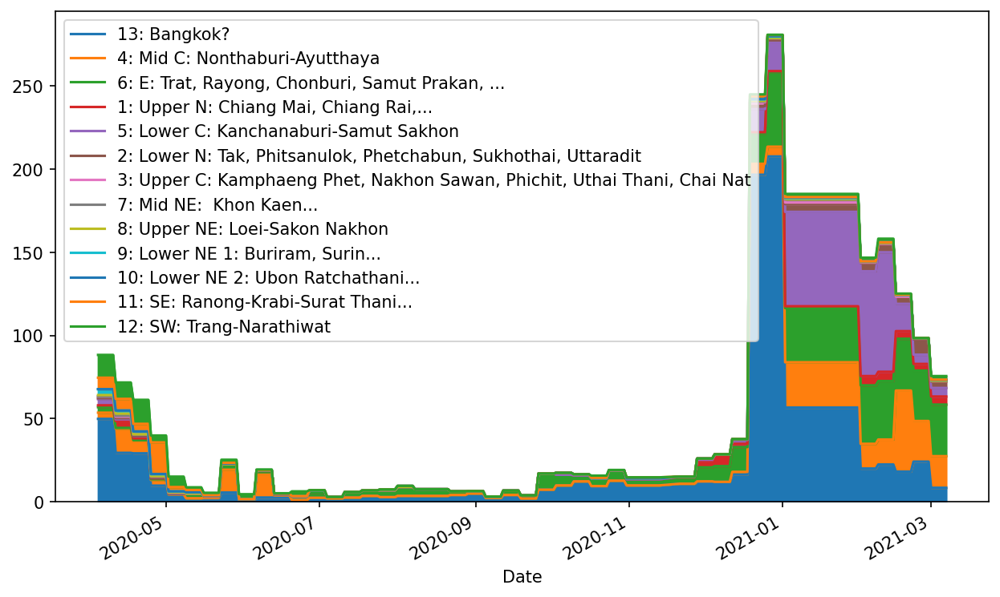

In [45]:
tests_by_area.plot.area(y=POS_AREA_SERIES).legend(AREA_LEGEND);

# What are health districts?

In [48]:
pd.read_html("https://en.wikipedia.org/wiki/Healthcare_in_Thailand#Health_Districts")[0]

,Health District Number,Area of Thailand,Area Code,Provinces
0,1,Upper Northern Region Area 1,15,"Chiang Mai, Mae Hong Son, Lampang, Lamphun"
1,1,Upper Northern Region Area 2,16,"Chiang Rai, Nan, Phayao, Phrae"
2,2,Lower Northern Region Area 1,17,"Tak, Phitsanulok, Phetchabun, Sukhothai, Uttar..."
3,3,Lower Northern Region Area 2,18,"Kamphaeng Phet, Nakhon Sawan, Phichit, Uthai T..."
4,3,Upper Central Region Area 1,2,Chai Nat
5,4,Upper Central Region Area 1,1,"Nonthaburi, Pathum Thani, Phra Nakhon Si Ayutt..."
6,4,Upper Central Region Area 2,2,"Lopburi, Sing Buri, Ang Thong"
7,4,Middle Central Region Area,3,Nakhon Nayok
8,5,Lower Central Region Area 1,4,"Kanchanaburi, Nakhon Pathom, Ratchaburi, Supha..."
9,5,Lower Central Region Area 2,5,"Prachuap Khiri Khan, Phetchaburi, Samut Songkh..."


In [50]:
pd.DataFrame(AREA_LEGEND)

,0
0,13: Bangkok?
1,4: Mid C: Nonthaburi-Ayutthaya
2,"6: E: Trat, Rayong, Chonburi, Samut Prakan, ..."
3,"1: Upper N: Chiang Mai, Chiang Rai,..."
4,5: Lower C: Kanchanaburi-Samut Sakhon
5,"2: Lower N: Tak, Phitsanulok, Phetchabun, Sukh..."
6,"3: Upper C: Kamphaeng Phet, Nakhon Sawan, Phic..."
7,7: Mid NE: Khon Kaen...
8,8: Upper NE: Loei-Sakon Nakhon
9,"9: Lower NE 1: Buriram, Surin..."


# What is Area 13?
Bangkok? I couldn't confirm this

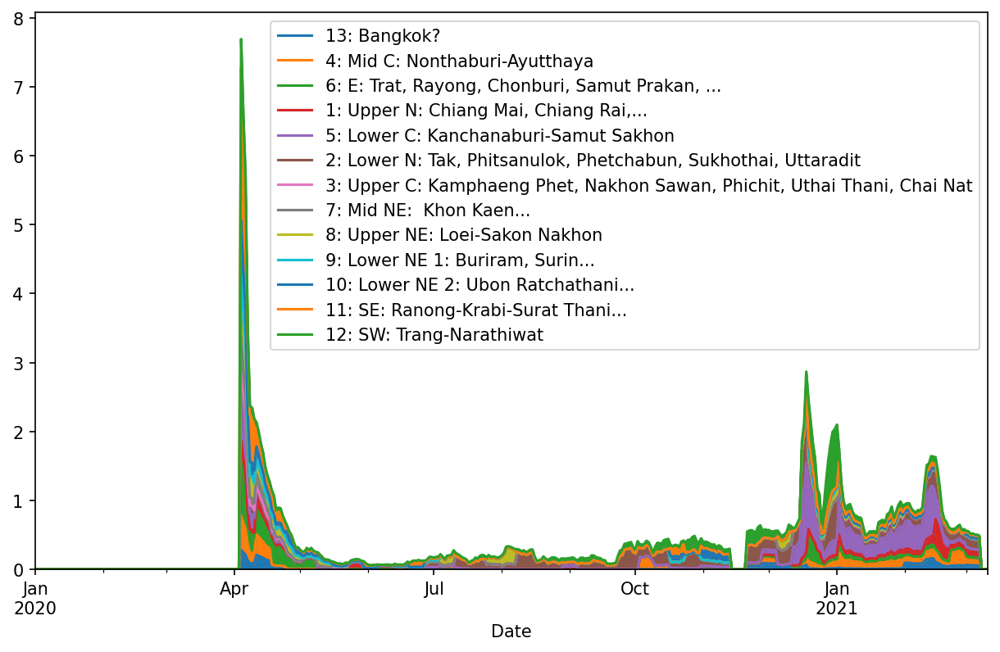

In [43]:
df = df.combine_first(tests_by_area)
for area in range(1, 14):
    df[f"Positivity {area}"] = (
        df[f"Pos Area {area}"] / df[f"Tests Area {area}"] * 100
    )
cols = [f"Positivity {area}" for area in range(1, 14)]
df["Total Positivity Area"] = df[cols].sum(axis=1)
# Scale so total height of stack represents public positive rate
for area in range(1, 14):
    df[f"Positivity {area}"] = (
        df[f"Positivity {area}"]
        / df["Total Positivity Area"]
        * df["Positivity XLS (MA)"]
    )

df.plot.area(y=cols).legend(AREA_LEGEND);

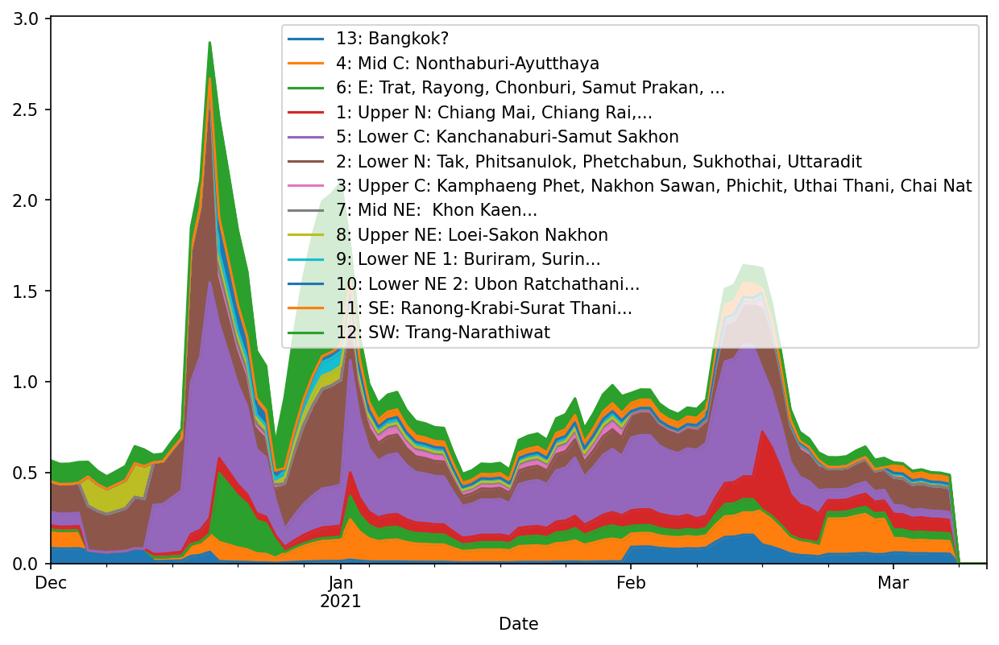

In [44]:
df.loc['2020-12-01':].plot.area(y=cols).legend(AREA_LEGEND);

# but...
- Don't forget we are missing anti-body tests so this is not accurate.

# Contribute?
- do you know where more data is?
- anti-body testing data?
- https://github.com/djay/covidthailand
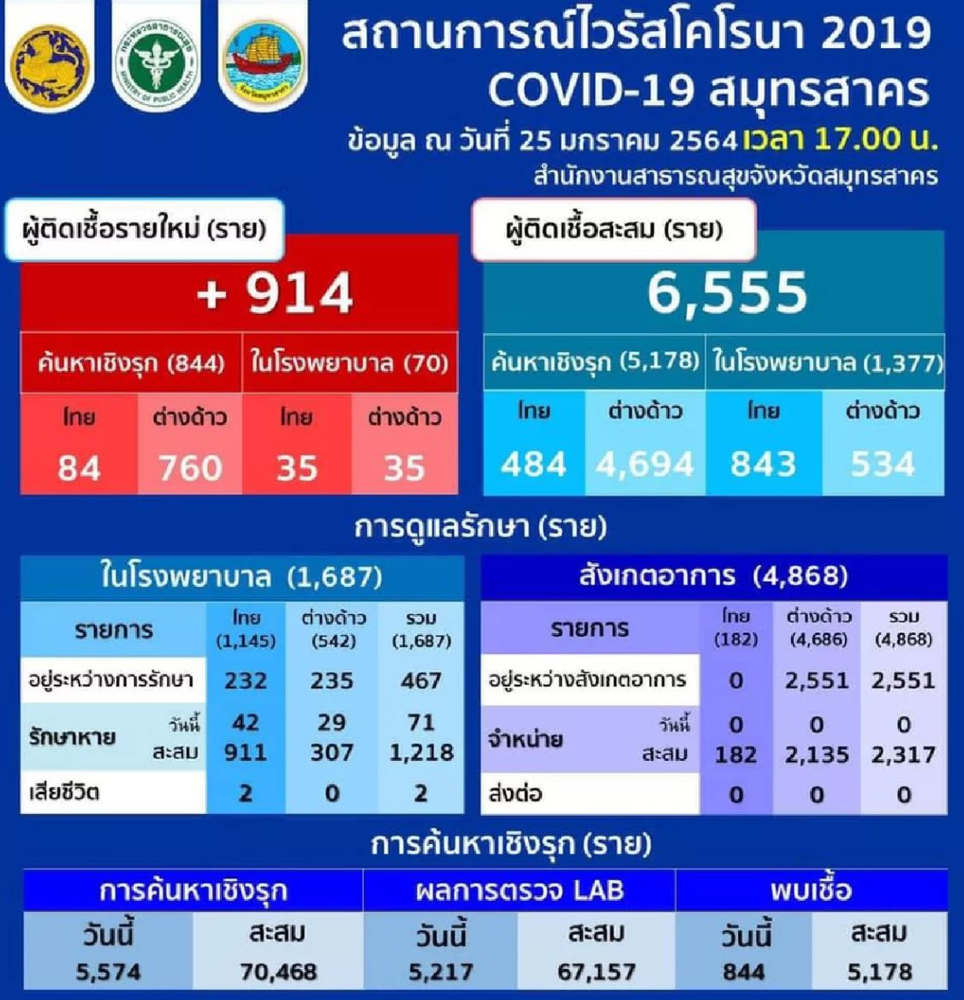

# Automating with github actions
- similar to TravisCI or CircleCI
- "on" - when to run
- "build" 
    - series of steps
    - base image
    - strategy. e.g. matrix
- step = 
   - "uses" - plugin 
   - "with" - params

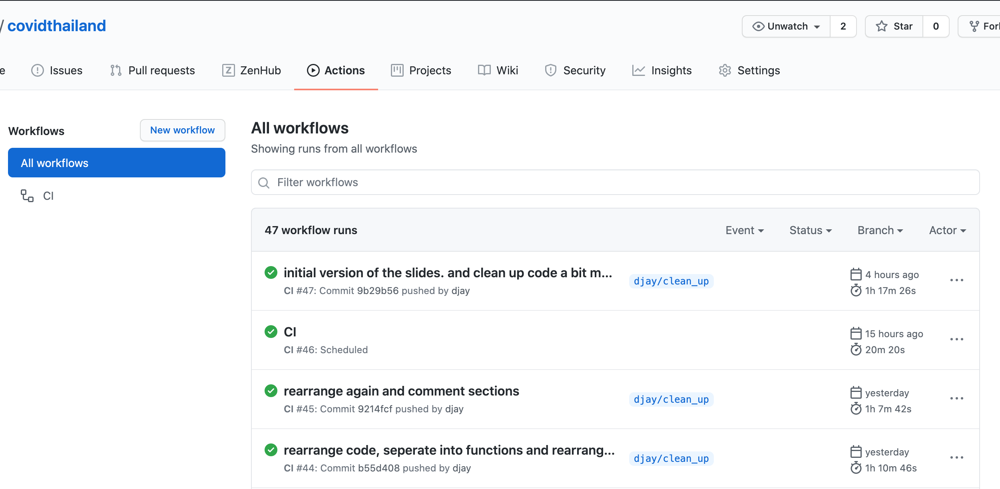


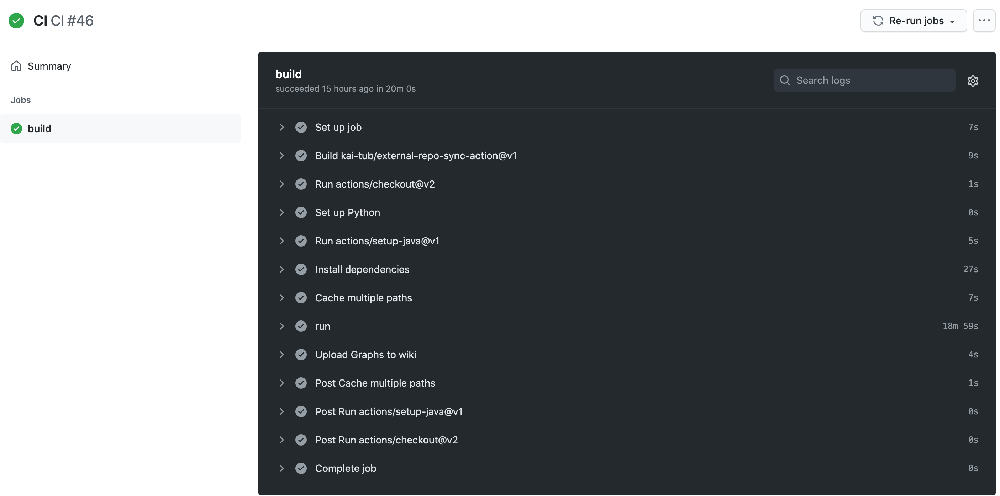

``` yaml
name: Upload plots to wiki
on:
  push:
    branches-ignore:
      - "releases/**"
  schedule:
    - cron: "0 15 * * *"
jobs:
  build:
    runs-on: ubuntu-latest
    strategy: fail-fast: false
    steps:
      - uses: actions/checkout@v2
      - name: Set up Python
        uses: actions/setup-python@v2
        with: python-version: 3.8
      - uses: actions/setup-java@v1
        with: java-version: 15
      - name: Install dependencies
        run: pip install -r requirements.txt
      - name: run
        run: CHECK_NEWER=True  python covidthailand.py
      - name: Upload Graphs to wiki
        uses: kai-tub/external-repo-sync-action@v1
        with:
            source-directory: "."
            include-patterns: "*.png"
        env: GH_ACCESS_TOKEN: ${{ secrets.GH_ACCESS_TOKEN }}      
```

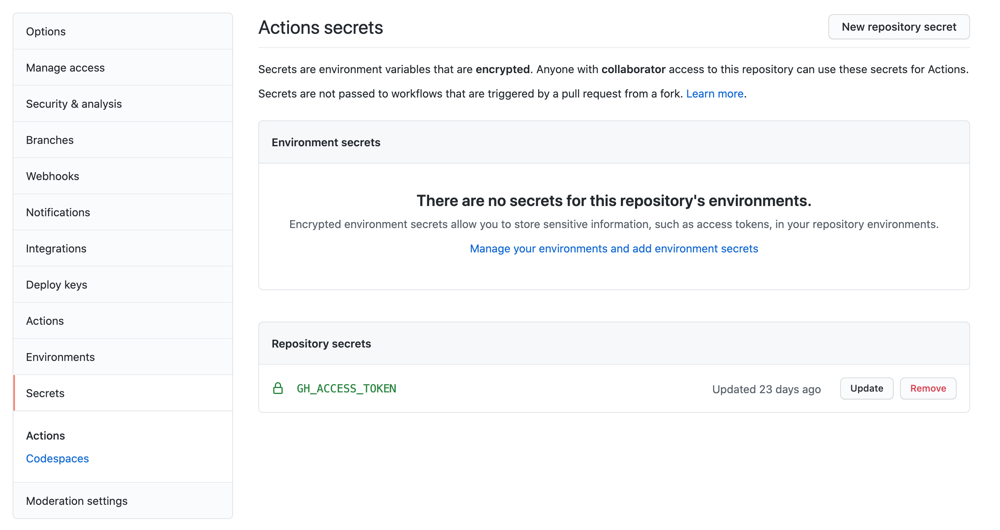

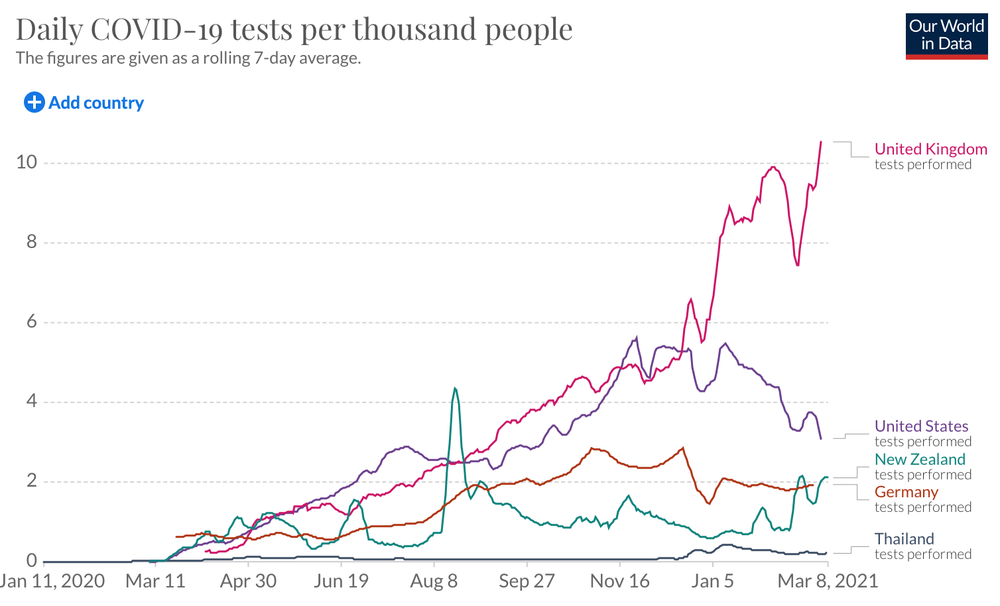

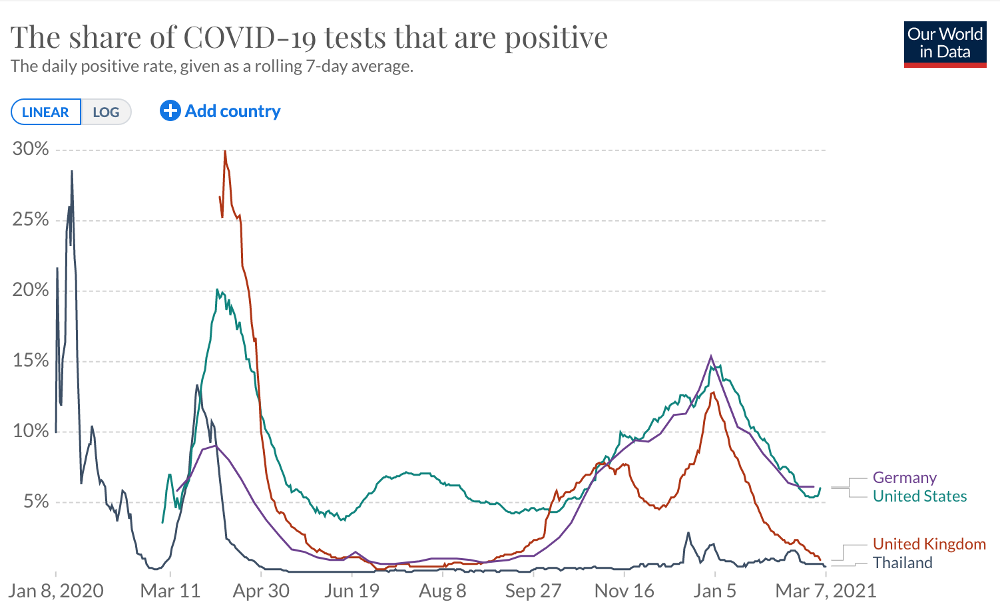

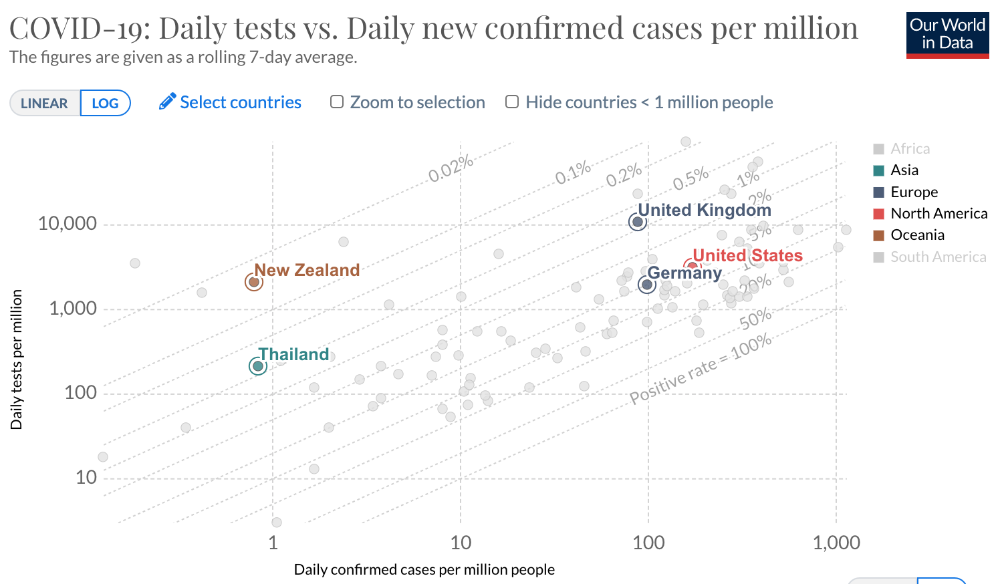

# Questions?
Questions? 
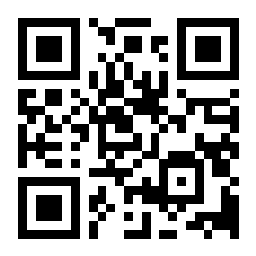
https://app.sli.do/event/exfpjpbq

Online? - go to gather.town to discuss with other pythonistas
